All required imports initialized

In [1]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sklearn.preprocessing as prep
from sklearn.datasets import make_blobs
from plotnine import *
# StandardScaler is a function to normalize the data
# You may also check MinMaxScaler and MaxAbsScaler
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage



from sklearn.metrics import silhouette_score

%matplotlib inline
# Please refer to the sklearn documentation to learn more about the different parameters for each clustering technique.

Creation of Synthetic Multi Blob Dataset

In [4]:
# Helper function to visualize clustering results
def display_cluster(X, labels, centers=None, title="Clustering Visualization"):
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='tab10', legend=None)
    if centers is not None:
        plt.scatter(centers[:, 0], centers[:, 1], c='red', marker='x', s=100, label='Centroids')
    plt.title(title)
    plt.show()

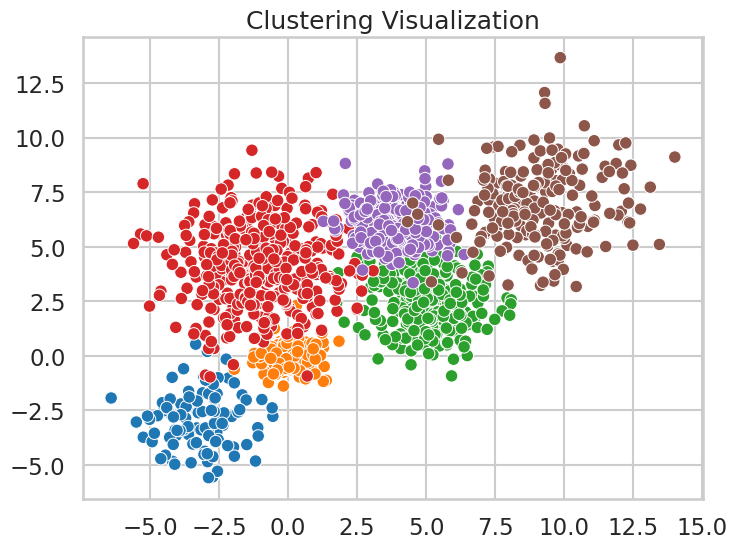

In [5]:
#Data Generation and Visualization
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")

n_bins = 6
centers = [(-3, -3), (0, 0), (5,2.5),(-1, 4), (4, 6), (9,7)]
Multi_blob_Data, y = make_blobs(n_samples=[100,150, 300, 400,300, 200], n_features=2, cluster_std=[1.3,0.6, 1.2, 1.7,0.9,1.7],
                  centers=centers, shuffle=False, random_state=42)
display_cluster(Multi_blob_Data,y)

In [ ]:
print(Multi_blob_Data)
print(y)

[[-2.3542716  -3.17974359]
 [-2.1580049  -1.02006119]
 [-3.30439939 -3.30437804]
 ...
 [ 9.86405669 13.6746041 ]
 [ 5.457008    9.9319843 ]
 [ 8.51133922  7.48845914]]
[0 0 0 ... 5 5 5]


In [6]:
# Standardize features in X for more accurate results after visualizing the data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(Multi_blob_Data)
X_non_scaled=Multi_blob_Data
X=Multi_blob_Data


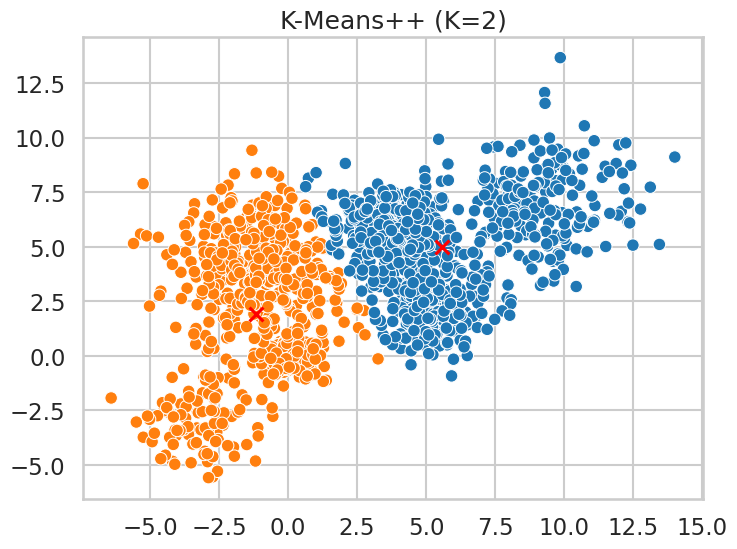

K=2, Silhouette Score: 0.4752


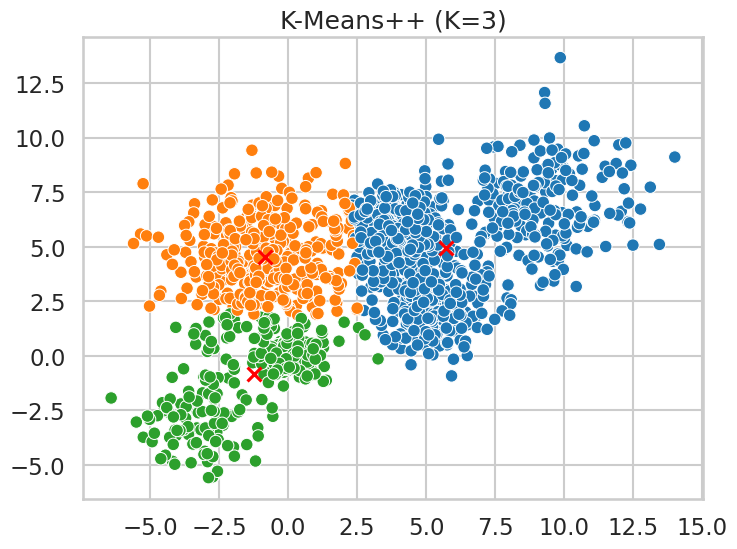

K=3, Silhouette Score: 0.4336


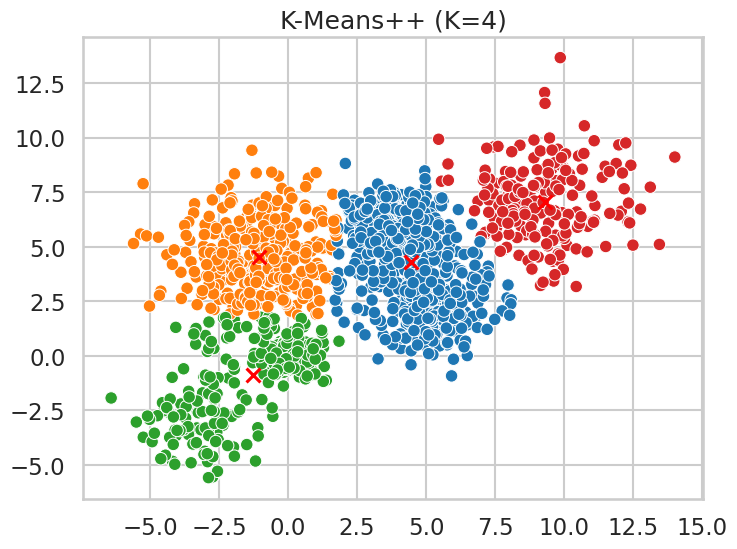

K=4, Silhouette Score: 0.4625


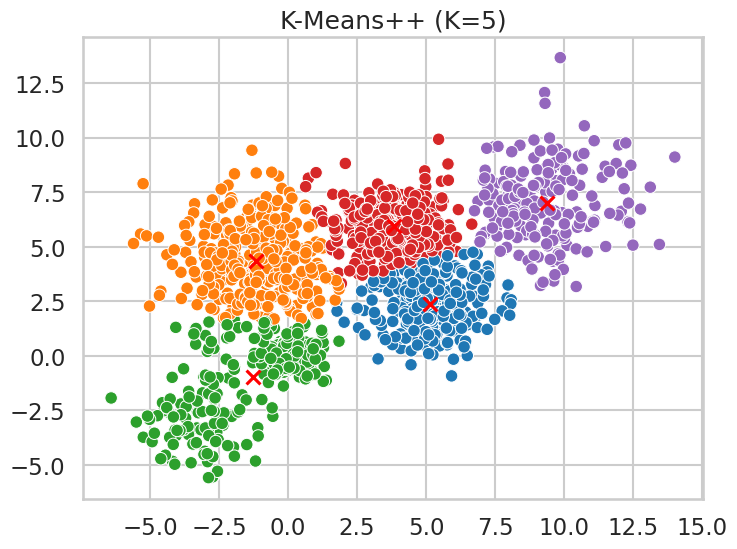

K=5, Silhouette Score: 0.4809


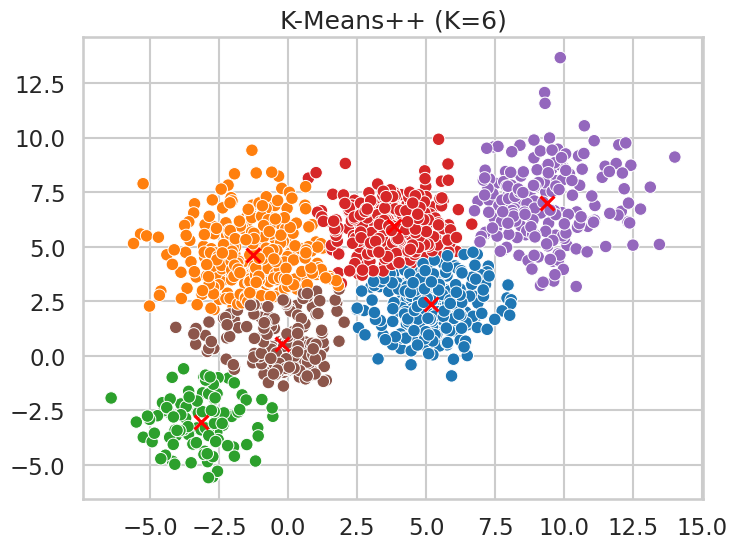

K=6, Silhouette Score: 0.4862


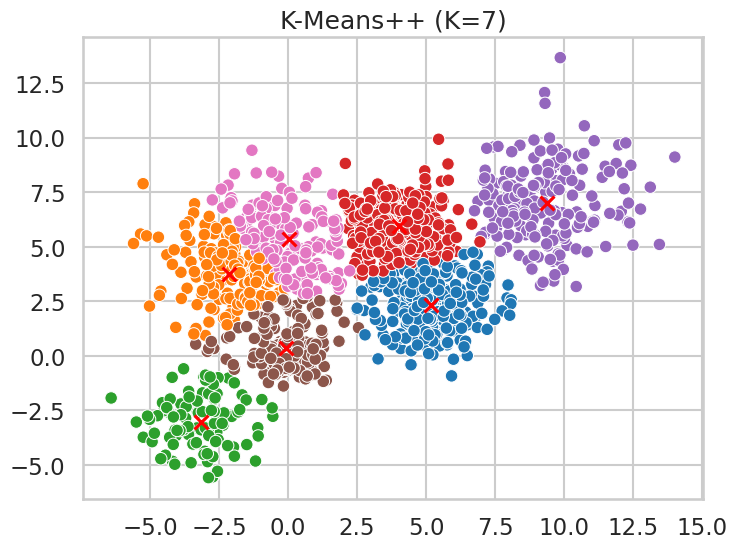

K=7, Silhouette Score: 0.4634


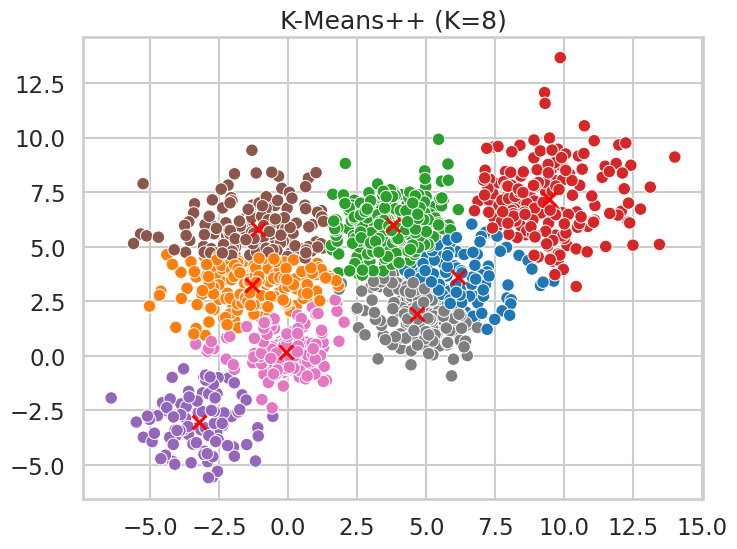

K=8, Silhouette Score: 0.4112


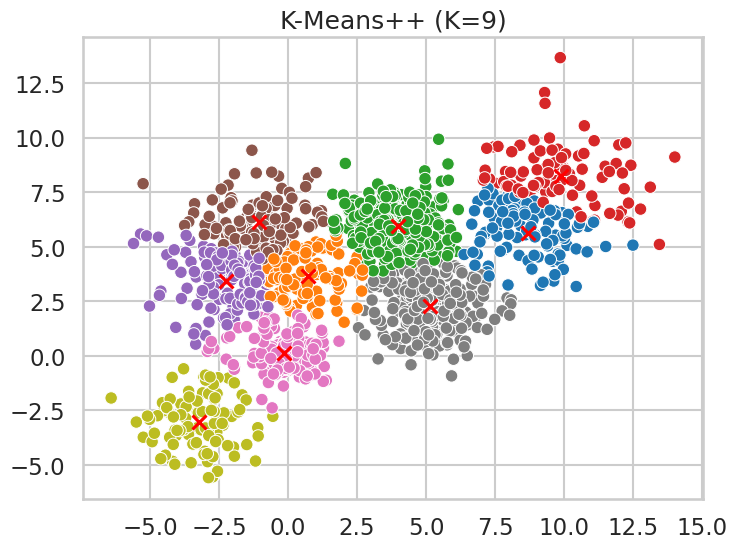

K=9, Silhouette Score: 0.4497


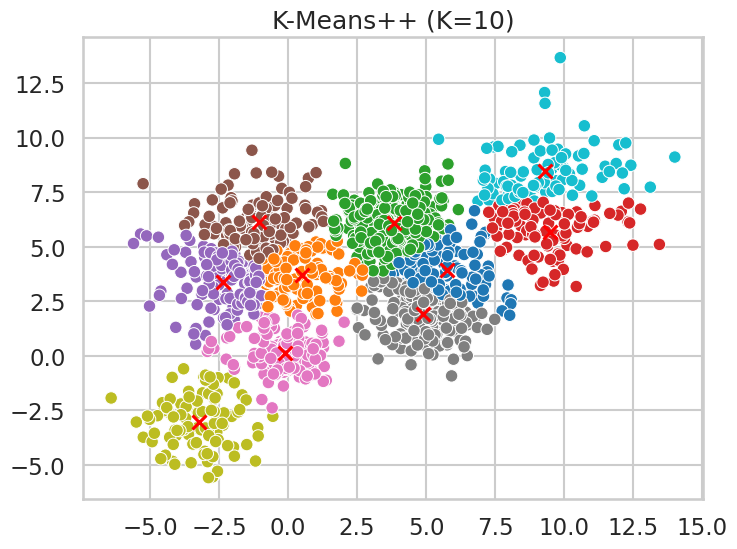

K=10, Silhouette Score: 0.4006


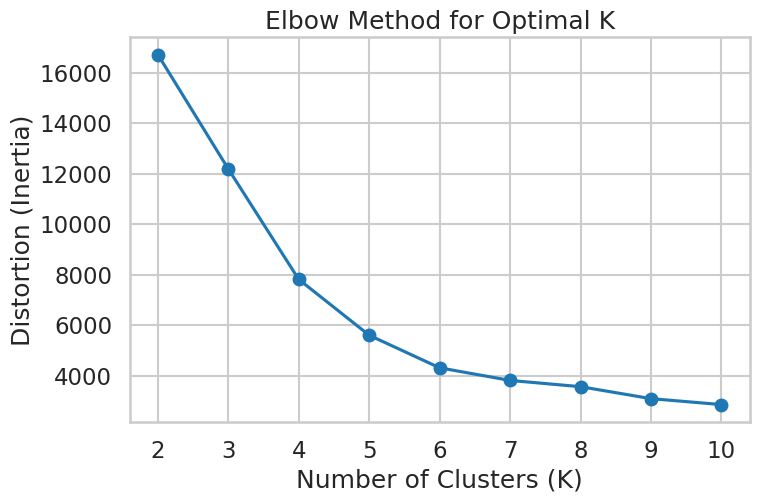

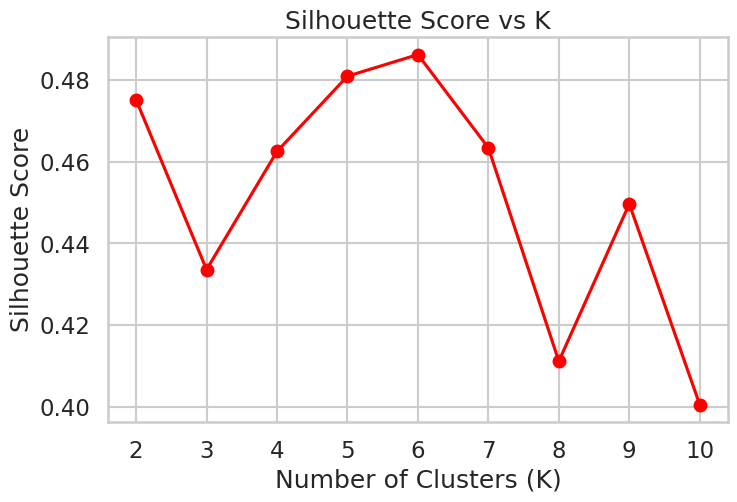

Best K chosen: 6 with Silhouette Score: 0.4862


In [ ]:
# K-Means Clustering with different K values on Non-Scaled Data
distortions = []
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans_labels = kmeans.fit_predict(X_non_scaled)
    distortions.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_non_scaled, kmeans_labels))
    display_cluster(X_non_scaled, kmeans_labels, kmeans.cluster_centers_, title=f"K-Means++ (K={k})")
    print(f"K={k}, Silhouette Score: {silhouette_scores[-1]:.4f}")

# Plot distortion function versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, distortions, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Distortion (Inertia)")
plt.title("Elbow Method for Optimal K")
plt.show()

# Plot silhouette_score versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', color='r')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs K")
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
best_silhouette_score = max(silhouette_scores)
print(f"Best K chosen: {best_k} with Silhouette Score: {best_silhouette_score:.4f}")

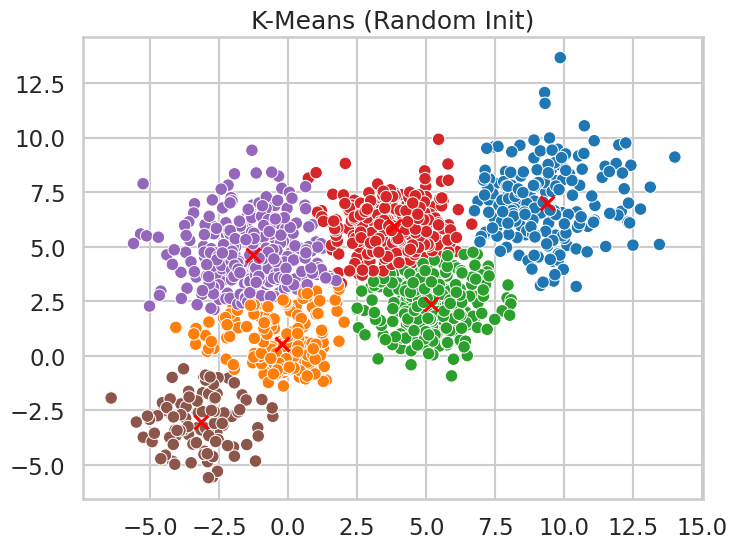

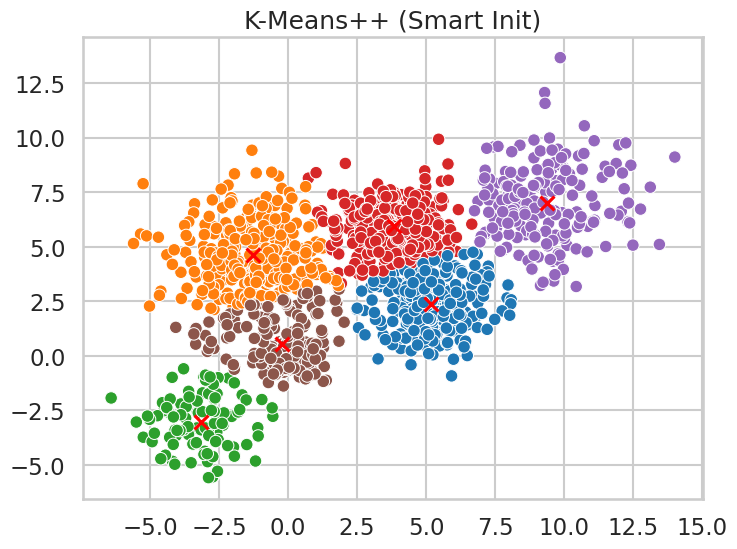

K-Means (Random Init) Silhouette Score: 0.4861
K-Means++ (Smart Init) Silhouette Score: 0.4862
Using k-means++ for centroid initialization helps avoid poor clustering by spreading initial centroids apart, leading to more stable results and faster convergence.
The comparison shows that K-Means++ generally leads to better clustering and a higher silhouette score.


In [ ]:
# Compare Normal K-Means vs K-Means++ in the case  of no Scaling applied to the data [X_non_scaled=Multi_blob_data]
kmeans_random = KMeans(n_clusters=best_k, init='random', random_state=42)
kmeans_plus = KMeans(n_clusters=best_k, init='k-means++', random_state=42)
kmeans_random_labels = kmeans_random.fit_predict(X_non_scaled)
kmeans_plus_labels = kmeans_plus.fit_predict(X_non_scaled)

display_cluster(X_non_scaled, kmeans_random_labels, kmeans_random.cluster_centers_, title="K-Means (Random Init)")
display_cluster(X_non_scaled, kmeans_plus_labels, kmeans_plus.cluster_centers_, title="K-Means++ (Smart Init)")

# Compare silhouette scores
random_silhouette = silhouette_score(X_non_scaled, kmeans_random_labels)
plus_silhouette = silhouette_score(X_non_scaled, kmeans_plus_labels)
print(f"K-Means (Random Init) Silhouette Score: {random_silhouette:.4f}")
print(f"K-Means++ (Smart Init) Silhouette Score: {plus_silhouette:.4f}")

# Comment on centroid initialization effect
print("Using k-means++ for centroid initialization helps avoid poor clustering by spreading initial centroids apart, leading to more stable results and faster convergence.")
print("The comparison shows that K-Means++ generally leads to better clustering and a higher silhouette score.")

Metric: euclidean, Linkage: complete, Distance Threshold: 1, Clusters: 209, Silhouette Score: 0.3467
Metric: euclidean, Linkage: complete, Distance Threshold: 2, Clusters: 85, Silhouette Score: 0.2927
Metric: euclidean, Linkage: complete, Distance Threshold: 3, Clusters: 47, Silhouette Score: 0.2896
Metric: euclidean, Linkage: complete, Distance Threshold: 4, Clusters: 29, Silhouette Score: 0.2870
Metric: euclidean, Linkage: complete, Distance Threshold: 4.0, Clusters: 29, Silhouette Score: 0.2870
Metric: euclidean, Linkage: complete, Distance Threshold: 4.1, Clusters: 28, Silhouette Score: 0.2831
Metric: euclidean, Linkage: complete, Distance Threshold: 4.199999999999999, Clusters: 28, Silhouette Score: 0.2831
Metric: euclidean, Linkage: complete, Distance Threshold: 4.299999999999999, Clusters: 28, Silhouette Score: 0.2831
Metric: euclidean, Linkage: complete, Distance Threshold: 4.399999999999999, Clusters: 25, Silhouette Score: 0.2887
Metric: euclidean, Linkage: complete, Distance 

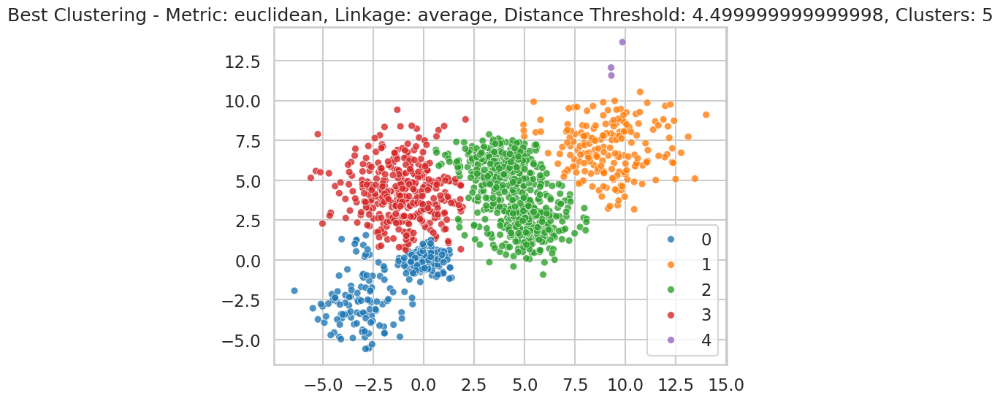

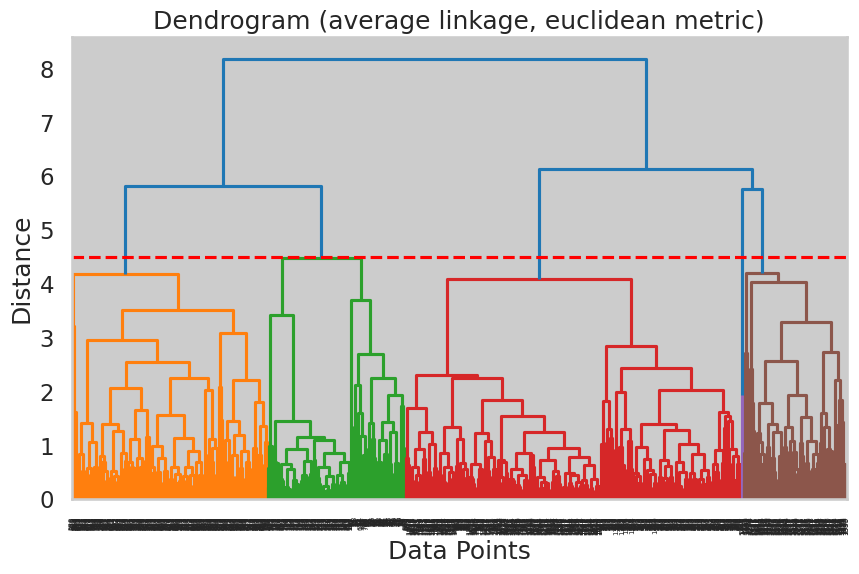

Best Parameters: {'metric': 'euclidean', 'linkage': 'average', 'distance_threshold': np.float64(4.499999999999998)}
Best Silhouette Score: 0.4332
Number of clusters in best configuration: 5


In [ ]:
#Agolomarative on Synthetic Data
# Parameters to iterate over including Distance thresolds
metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['complete', 'average', 'single']
distance_thresholds = [1, 2, 3, 4] + list(np.arange(4, 5.1, 0.1))

best_silhouette = -1
best_params = {}
best_labels = None
best_num_clusters = 0

# Loop through parameters
for metric in metrics:
    for linkage_method in linkages:
        for dist_thresh in distance_thresholds:
            try:
                # Ward linkage only works with Euclidean distance
                if linkage_method == 'ward' and metric != 'euclidean':
                    continue

                # Perform Agglomerative Clustering
                clustering = AgglomerativeClustering(
                    n_clusters=None, metric=metric, linkage=linkage_method, distance_threshold=dist_thresh
                )
                labels = clustering.fit_predict(X)
                num_clusters = len(set(labels))

                # Calculate silhouette score (only valid for more than 1 cluster)
                if num_clusters > 1:
                    sil_score = silhouette_score(X, labels)
                    print(f'Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {dist_thresh}, Clusters: {num_clusters}, Silhouette Score: {sil_score:.4f}')

                    # Track the best silhouette score
                    if sil_score > best_silhouette:
                        best_silhouette = sil_score
                        best_params = {'metric': metric, 'linkage': linkage_method, 'distance_threshold': dist_thresh}
                        best_labels = labels
                        best_num_clusters = num_clusters
            except Exception as e:
                print(f'Error with metric={metric}, linkage={linkage_method}, distance_threshold={dist_thresh}: {e}')

# Display the best clustering result
if best_labels is not None:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=best_labels, palette='tab10', s=50, alpha=0.8)
    plt.title(f'Best Clustering - Metric: {best_params["metric"]}, Linkage: {best_params["linkage"]}, Distance Threshold: {best_params["distance_threshold"]}, Clusters: {best_num_clusters}')
    plt.show()

from scipy.spatial.distance import pdist

if best_params:
    # Compute the linkage matrix with the best metric and linkage
    linked = linkage(pdist(X, metric=best_params['metric']), method=best_params['linkage'])

    plt.figure(figsize=(10, 6))
    dendrogram(linked, color_threshold=best_params['distance_threshold'])  # Color clusters at the distance threshold
    plt.axhline(y=best_params['distance_threshold'], color='r', linestyle='--')  # Draw the threshold line

    plt.title(f'Dendrogram ({best_params["linkage"]} linkage, {best_params["metric"]} metric)')
    plt.xlabel('Data Points')
    plt.ylabel('Distance')
    plt.show()

# Print the best parameters and silhouette score
print(f'Best Parameters: {best_params}')
print(f'Best Silhouette Score: {best_silhouette:.4f}')
print(f'Number of clusters in best configuration: {best_num_clusters}')

**Since we know that the original data has 6 clusters (based on prior knowledge or ground truth), and the 6-cluster solution gives us results more similar to the actual clusters, we might prioritize the 6-cluster configuration, even though the silhouette score is slightly lower.**

Silhouette Score: 0.415


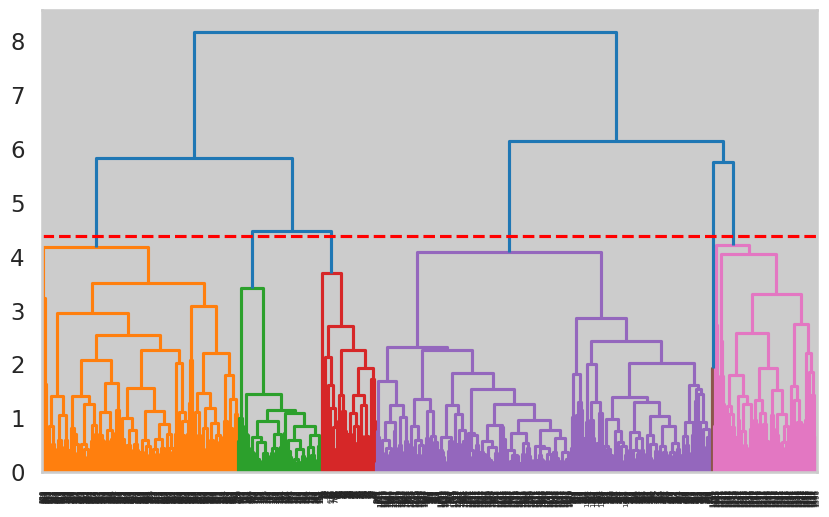

<Axes: >

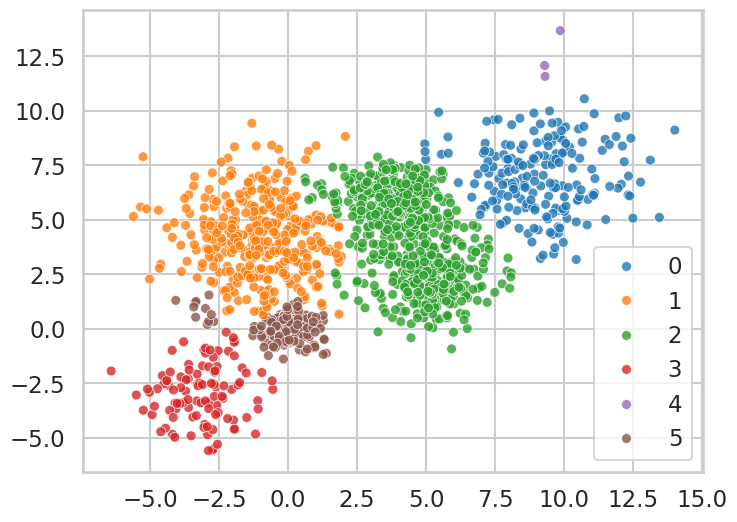

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import pdist

# Assuming X is your dataset (already defined)

# 1. Compute the linkage matrix with the best metric and linkage
linked = linkage(pdist(X, metric='euclidean'), method='average')

# 2. Plot the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(linked, color_threshold=4.38)  # Color clusters at the distance threshold
plt.axhline(y=4.38, color='r', linestyle='--')  # Draw the threshold line

# 3. Perform Agglomerative Clustering
dist_thresh = 4.38  # Define the distance threshold
metric = 'euclidean'  # Use Euclidean distance
linkage_method = 'average'  # Use average linkage

# Perform Agglomerative Clustering with the specified parameters
clustering = AgglomerativeClustering(
    n_clusters=None,  # We do not specify the number of clusters, we use the distance threshold
    metric=metric,
    linkage=linkage_method,
    distance_threshold=dist_thresh  # Set the threshold for cluster formation
)

# Fit the model and get the labels (cluster assignments)
labels = clustering.fit_predict(X)

# Determine the number of clusters formed
num_clusters = len(set(labels))

# 4. Calculate silhouette score (only if more than 1 cluster is formed)
if num_clusters > 1:
    sil_score = silhouette_score(X, labels, metric='euclidean')
    print(f"Silhouette Score: {sil_score:.3f}")
else:
    print("Silhouette score cannot be computed for a single cluster.")

# Show the plot
plt.show()
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='tab10', s=50, alpha=0.8)



Best EPS: 0.7999999999999999, Best Min_samples: 8, Best Silhouette Score: 0.3051951203876005 , Number of Clusters: 2


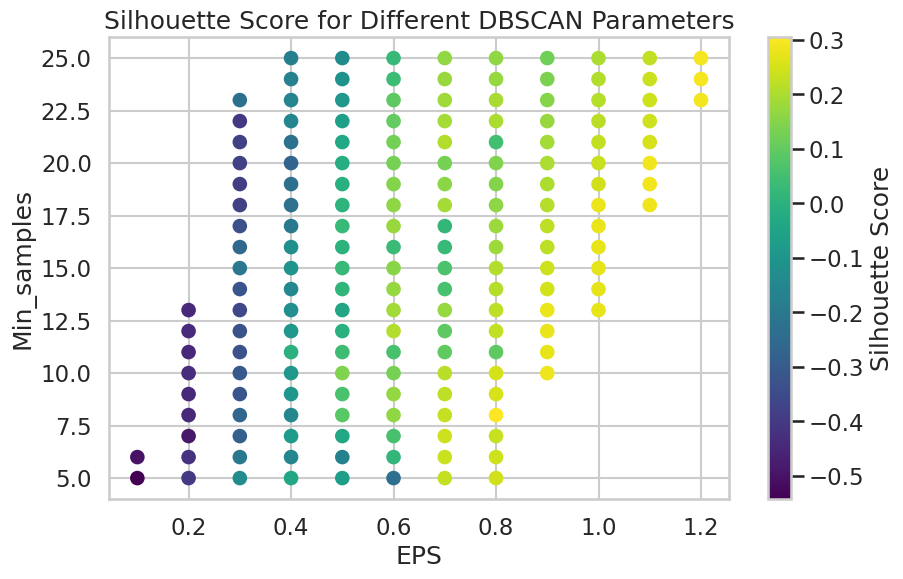

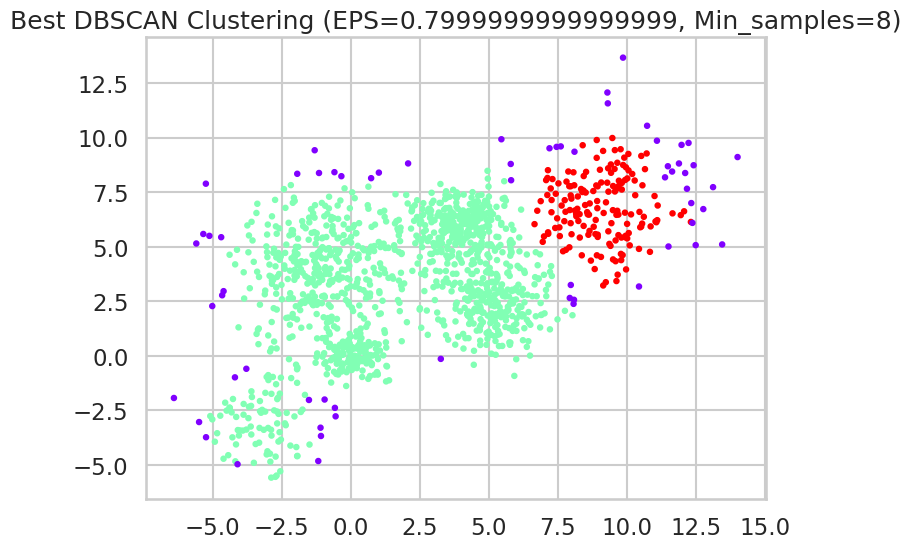

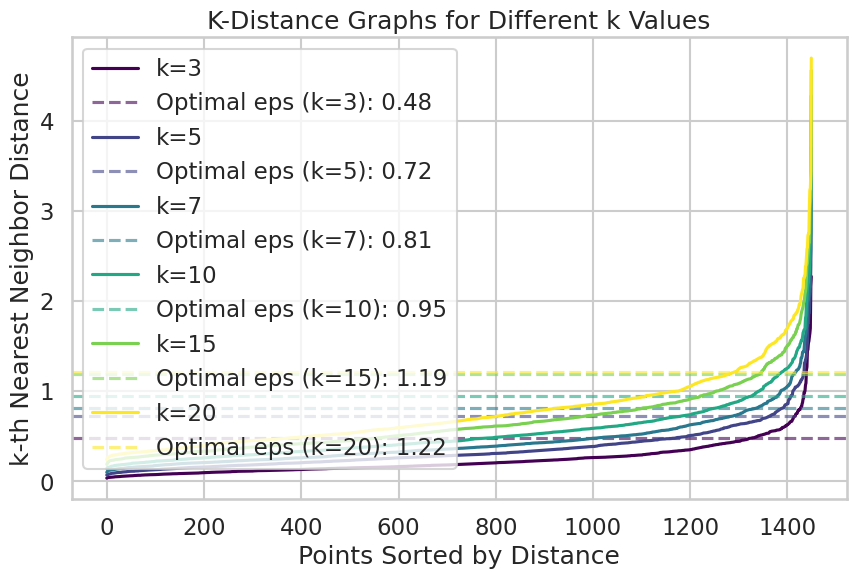

Optimal eps values for each k: {3: np.float64(0.48428826223665766), 5: np.float64(0.724407045666779), 7: np.float64(0.8131287838002086), 10: np.float64(0.9456918931847627), 15: np.float64(1.1891082197963003), 20: np.float64(1.2175205166868992)}


In [ ]:
#DBSCAN ON Synthetic Data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
# Range of EPS and Min_samples values to test
eps_values = np.linspace(0.1, 3, 30)  # 30 values from 0.1 to 3
min_samples_values = range(5, 26)  # From 5 to 25

best_score = -1
best_params = None
best_labels = None
best_model = None
num_clusters_dict = {}

# Loop over different combinations of EPS and Min_samples
silhouette_scores = []
param_combinations = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)

        # Count number of clusters (excluding noise)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Only evaluate silhouette score if there are at least 2 clusters
        if num_clusters > 1:
            score = silhouette_score(X, labels)
            silhouette_scores.append(score)
            param_combinations.append((eps, min_samples))
            num_clusters_dict[(eps, min_samples)] = num_clusters

            if score > best_score:
                best_score = score
                best_params = (eps, min_samples,num_clusters)
                best_labels = labels
                best_model = dbscan

# Extracting the best parameters
eps_best, min_samples_best,num_clusters = best_params
print(f"Best EPS: {eps_best}, Best Min_samples: {min_samples_best}, Best Silhouette Score: {best_score} , Number of Clusters: {num_clusters}")

# Plot silhouette scores
fig = plt.figure(figsize=(10, 6))
plt.scatter([p[0] for p in param_combinations], [p[1] for p in param_combinations], c=silhouette_scores, cmap='viridis', marker='o')
plt.colorbar(label='Silhouette Score')
plt.xlabel('EPS')
plt.ylabel('Min_samples')
plt.title('Silhouette Score for Different DBSCAN Parameters')
plt.show()

# Plot best clusters
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=best_labels, cmap='rainbow', s=10)
plt.title(f'Best DBSCAN Clustering (EPS={eps_best}, Min_samples={min_samples_best})')
plt.show()

def find_elbow_point(distances):
    """Alternative method to find the elbow point using the maximum curvature."""
    n_points = len(distances)
    all_coords = np.vstack((range(n_points), distances)).T

    # Define a line from the first to the last point
    first_point = all_coords[0]
    last_point = all_coords[-1]
    line_vec = last_point - first_point
    line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))

    # Compute distances to the line (perpendicular distance)
    vec_from_first = all_coords - first_point
    scalar_product = np.sum(vec_from_first * line_vec_norm, axis=1)
    vec_proj = np.outer(scalar_product, line_vec_norm)
    perpendicular_vec = vec_from_first - vec_proj
    distances_to_line = np.sqrt(np.sum(perpendicular_vec**2, axis=1))

    elbow_index = np.argmax(distances_to_line)
    return elbow_index, distances[elbow_index]

def plot_k_distance_graphs(data, k_values):
    plt.figure(figsize=(10, 6))
    optimal_eps_values = {}

    # Define color map for different k values
    colors = plt.cm.viridis(np.linspace(0, 1, len(k_values)))

    for i, (k, color) in enumerate(zip(k_values, colors)):
        # Compute the k-distance
        neigh = NearestNeighbors(n_neighbors=k)
        neigh.fit(data)
        distances, _ = neigh.kneighbors(data)

        # Sort the k-th nearest neighbor distance in ascending order
        k_distances = np.sort(distances[:, k - 1])

        # Find the elbow point using the max curvature method
        elbow_index, optimal_eps = find_elbow_point(k_distances)
        optimal_eps_values[k] = optimal_eps

        # Plot all graphs in one figure
        plt.plot(range(len(k_distances)), k_distances, label=f'k={k}', color=color)
        if optimal_eps is not None:
            plt.axhline(y=optimal_eps, color=color, linestyle='--', alpha=0.6, label=f'Optimal eps (k={k}): {optimal_eps:.2f}')

    plt.xlabel("Points Sorted by Distance")
    plt.ylabel("k-th Nearest Neighbor Distance")
    plt.title("K-Distance Graphs for Different k Values")
    plt.legend()
    plt.show()

    return optimal_eps_values


# List of k values to test
k_values = [3, 5, 7, 10, 15, 20]

# Generate K-Distance Graphs and get optimal eps values
optimal_eps_values = plot_k_distance_graphs(X, k_values)
print("Optimal eps values for each k:", optimal_eps_values)





**Conclusions:**

**K-means++** is the best choice here because the dataset is originally made up of 6 clusters, and the method’s output aligns perfectly with this structure. It also has the highest silhouette score, indicating well-separated and well-defined clusters.

**Hierarchical clustering**, while giving a good result (5 clusters), is slightly less effective than K-means++ for this specific dataset. It could be more useful if you were interested in understanding the relationships between clusters hierarchically or if the true number of clusters was not known.

**DBSCAN** struggles with this dataset, particularly because it finds only 2 clusters and a low silhouette score, suggesting that it has difficulty identifying meaningful clusters due to noise or the chosen parameters.

In [ ]:
#Here I was thinking of performing PCA to reduce the diensions in into 2 only for better visualization of the plots but It won't give accurate results so I performed clustering on all the features normally and I used two features only for visualization in the plots
from sklearn.decomposition import PCA
#Easier Visualization: Instead of plotting 4D, we compress to 2D while keeping the structure.
# Applied PCA to reduce dimensions from 4D to 2D
#pca = PCA(n_components=2)
#X_pca = pca.fit_transform(X)
#feature_1 = df.columns[1]  # First column
#feature_2 = df.columns[2]  # Second column
#X_pca_plot = df[[feature_1, feature_2]].values  # Extract selected feature columns

#X_pca_scaled=X_scaled
#X_pca_scaled =pca.fit_transform(X_scaled)

# **IRIS Dataset**

In [ ]:
import seaborn as sns
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

# Load the dataset
iris_data = load_iris()
df = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)
df['species'] = iris_data.target
#X=df
X = iris_data.data
y = iris_data.target
X_scaled = scaler.fit_transform(X)
# Replace numeric labels with actual species names
#df['species'] = df['species'].map({0: 'setosa', 1: 'versicolor', 2: 'virginica'})

df.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


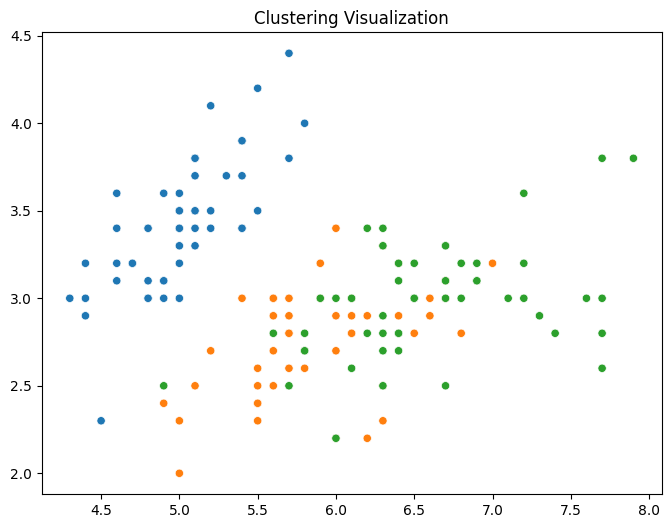

In [ ]:
display_cluster(X,y)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   sepal length (cm)  150 non-null    float64
 1   sepal width (cm)   150 non-null    float64
 2   petal length (cm)  150 non-null    float64
 3   petal width (cm)   150 non-null    float64
 4   species            150 non-null    int32  
dtypes: float64(4), int32(1)
memory usage: 5.4 KB


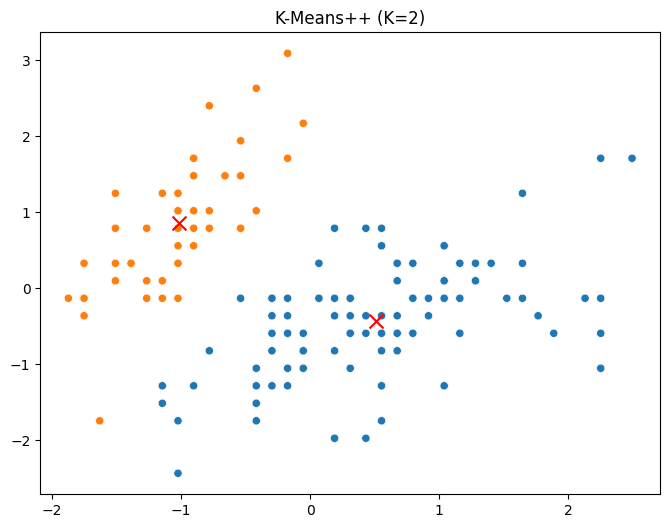

K=2, Silhouette Score: 0.5818


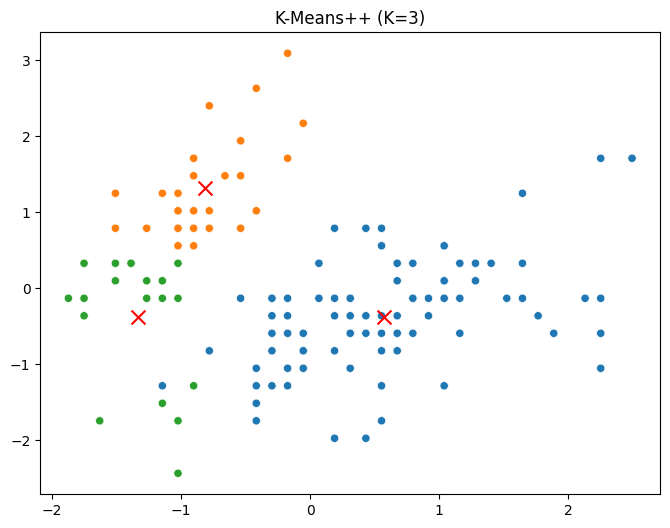

K=3, Silhouette Score: 0.4799


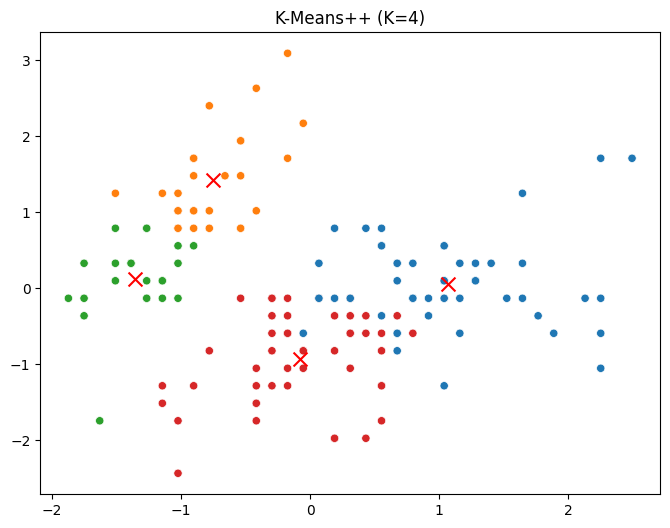

K=4, Silhouette Score: 0.3850


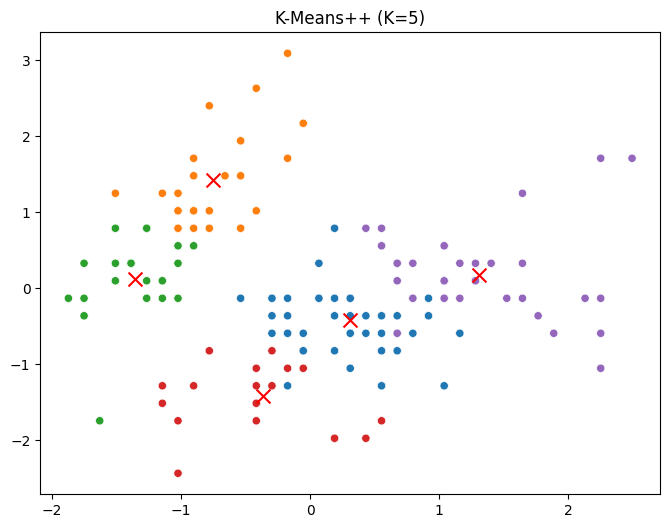

K=5, Silhouette Score: 0.3450


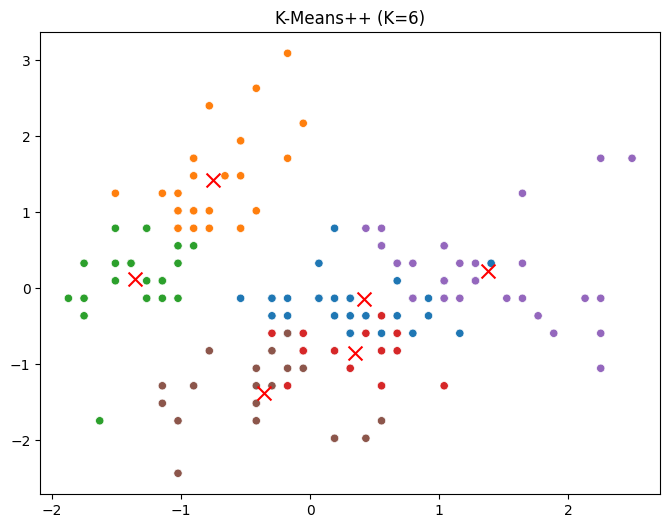

K=6, Silhouette Score: 0.3339


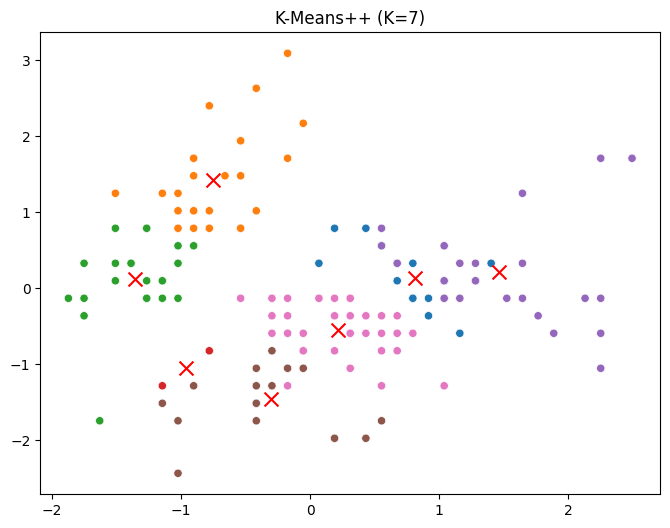

K=7, Silhouette Score: 0.2664


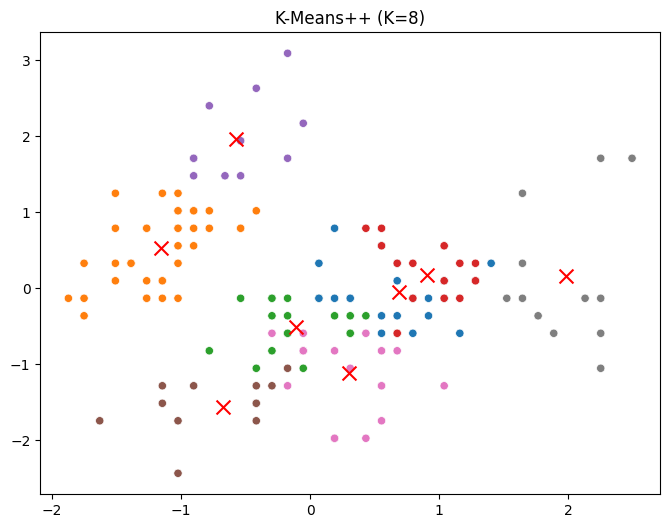

K=8, Silhouette Score: 0.3416


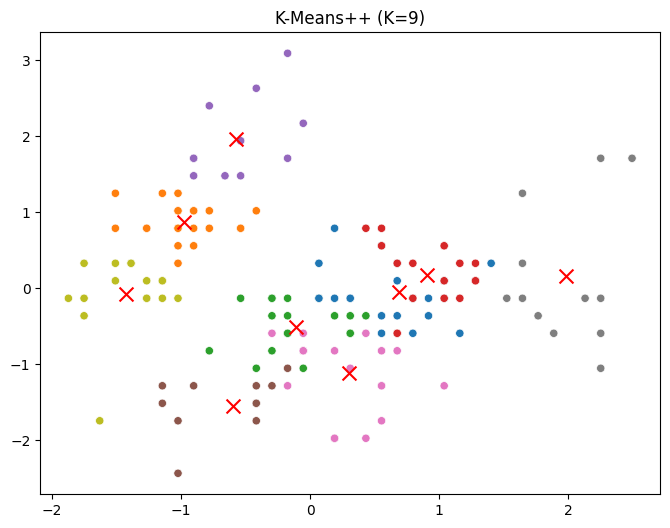

K=9, Silhouette Score: 0.3244


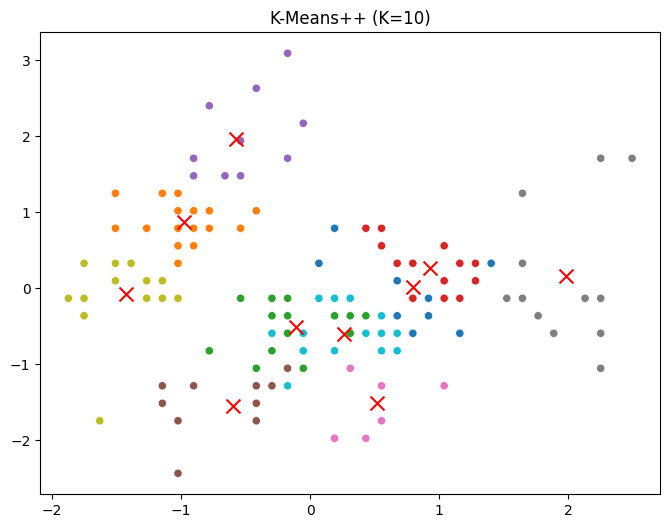

K=10, Silhouette Score: 0.3354


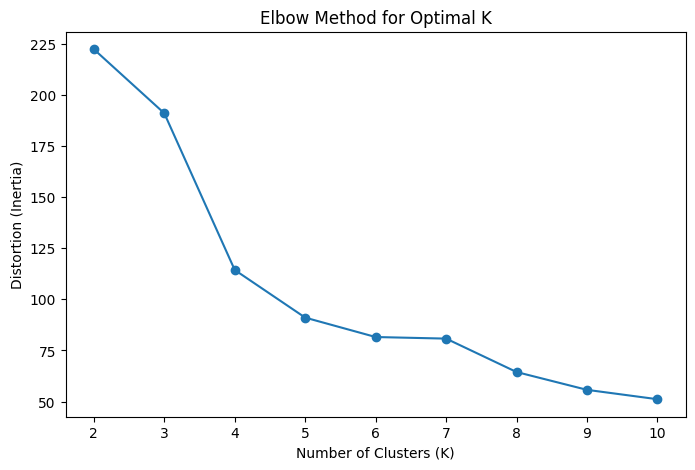

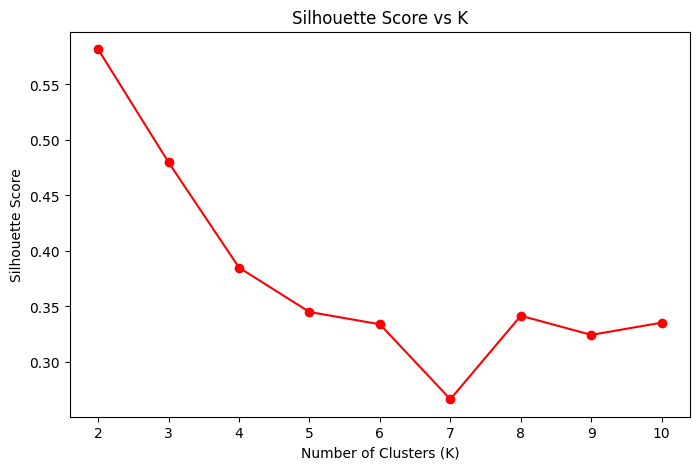

Best K chosen: 2 with Silhouette Score: 0.5818


In [ ]:
# K-Means Clustering with different K values on Scaled Data
distortions = []
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans_labels = kmeans.fit_predict(X_scaled)
    distortions.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, kmeans_labels))
    display_cluster(X_scaled, kmeans_labels, kmeans.cluster_centers_, title=f"K-Means++ (K={k})")
    print(f"K={k}, Silhouette Score: {silhouette_scores[-1]:.4f}")

# Plot distortion function versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, distortions, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Distortion (Inertia)")
plt.title("Elbow Method for Optimal K")
plt.show()

# Plot silhouette_score versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', color='r')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs K")
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
best_silhouette_score = max(silhouette_scores)
print(f"Best K chosen: {best_k} with Silhouette Score: {best_silhouette_score:.4f}")

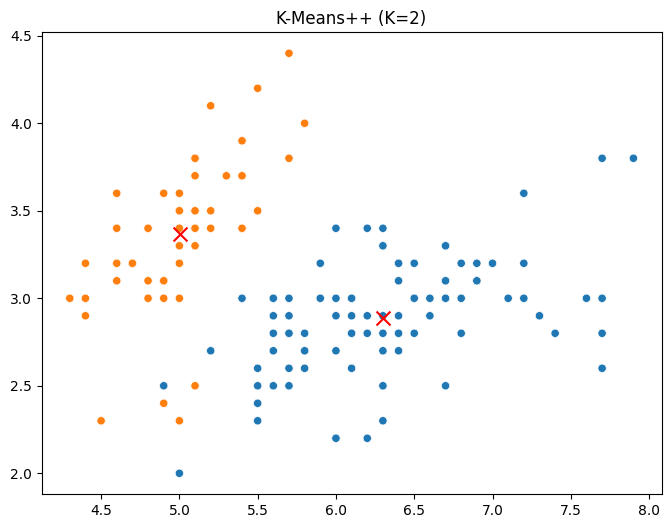

K=2, Silhouette Score: 0.6810


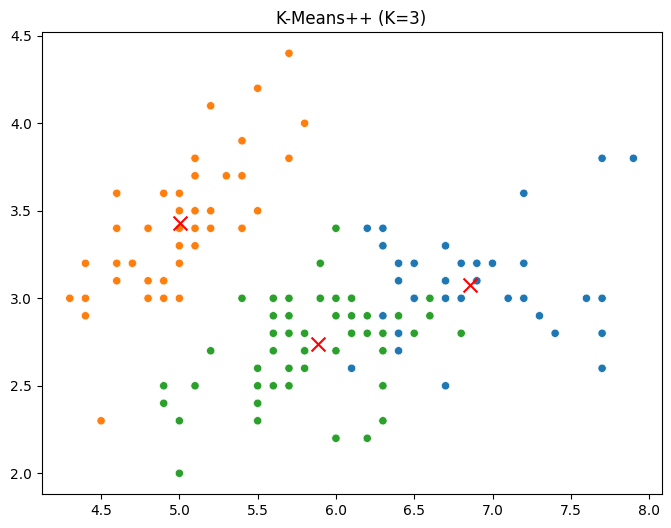

K=3, Silhouette Score: 0.5512


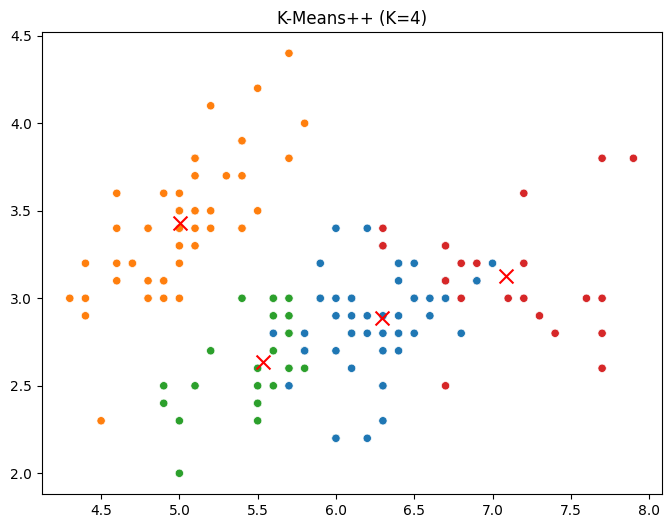

K=4, Silhouette Score: 0.4976


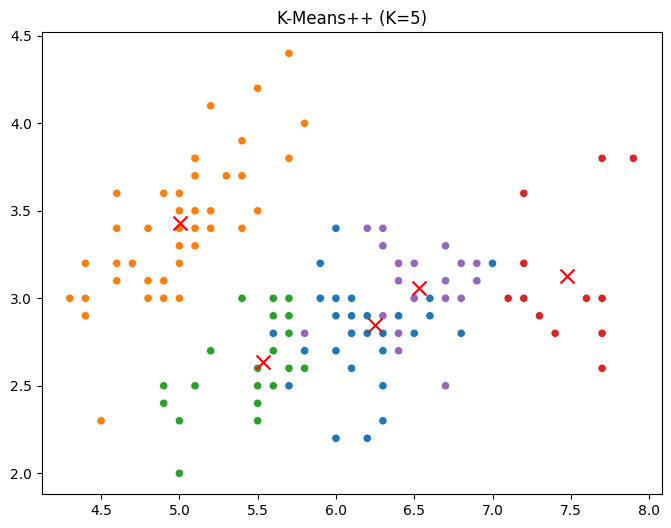

K=5, Silhouette Score: 0.4931


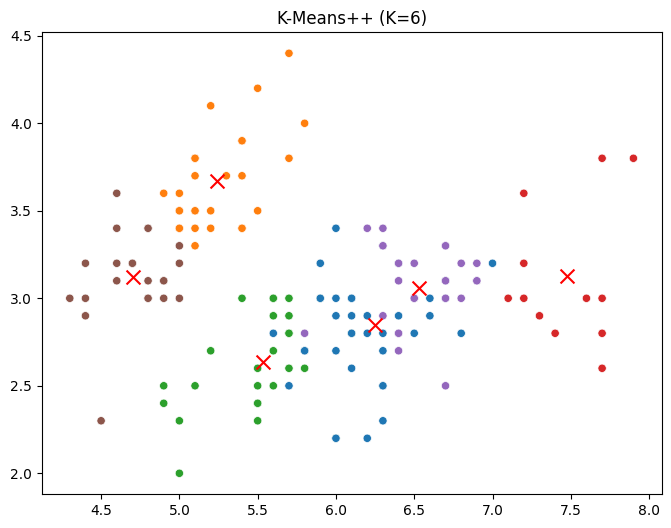

K=6, Silhouette Score: 0.3678


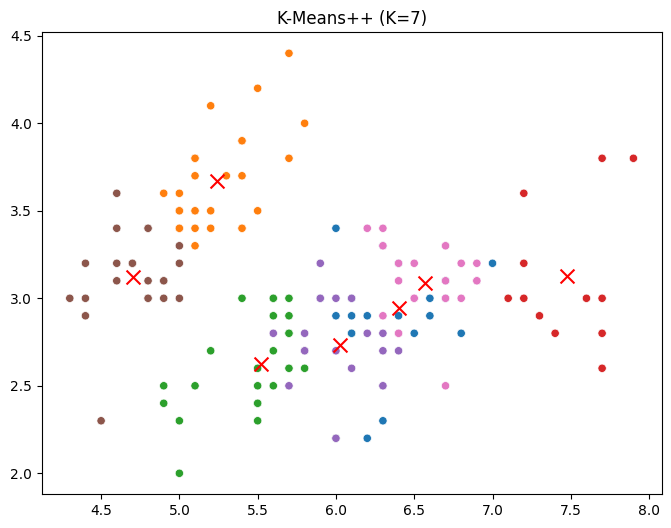

K=7, Silhouette Score: 0.3543


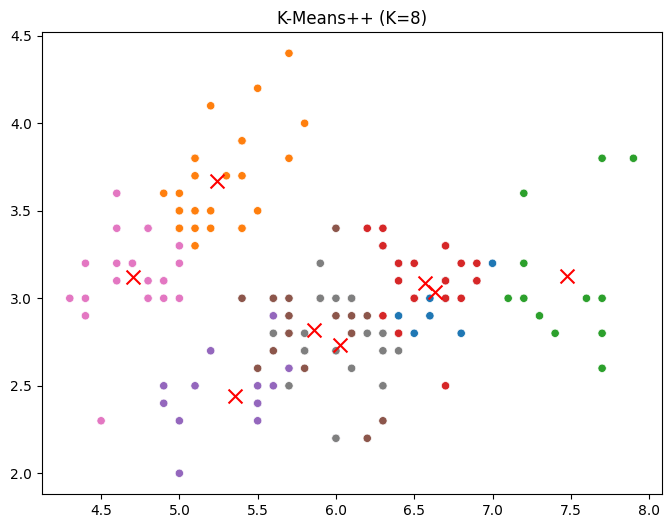

K=8, Silhouette Score: 0.3447


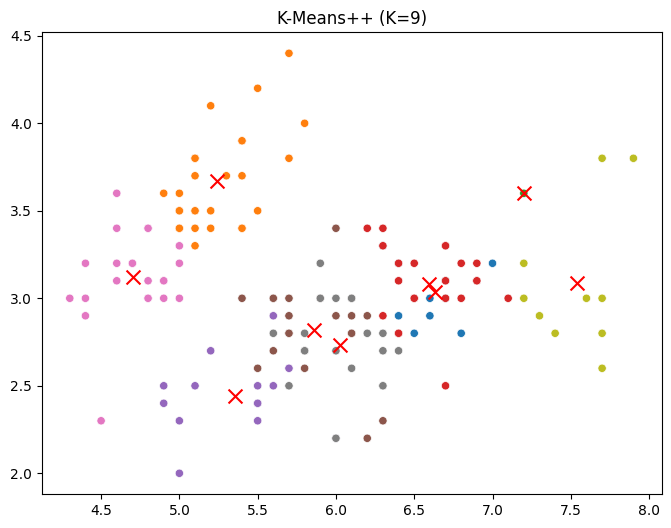

K=9, Silhouette Score: 0.3156


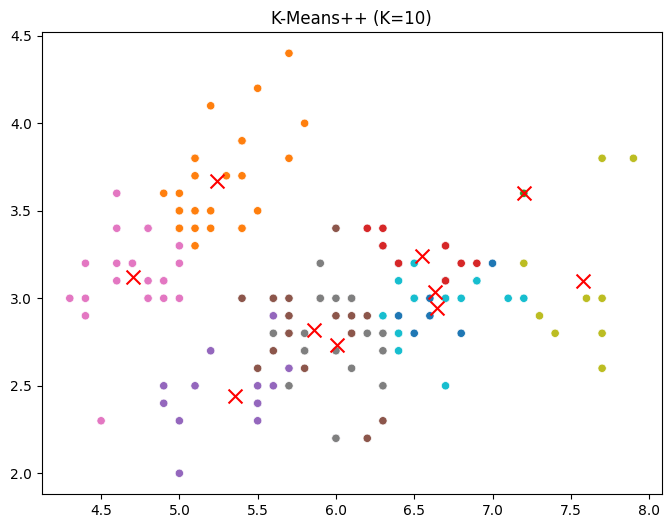

K=10, Silhouette Score: 0.3014


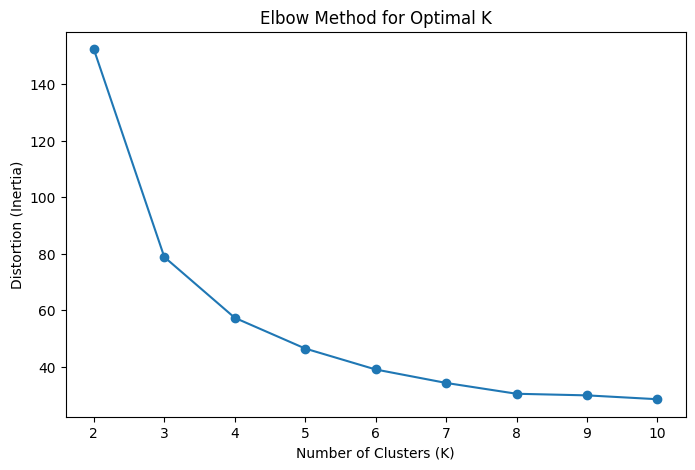

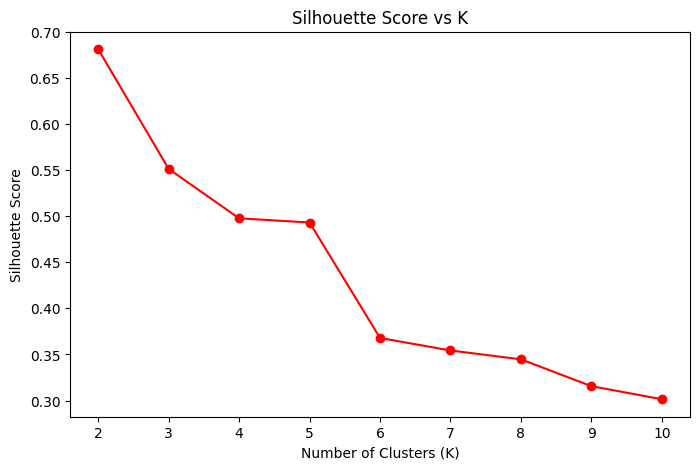

Best K chosen: 2 with Silhouette Score: 0.6810


In [ ]:
# K-Means Clustering with different K values on Non-Scaled Data
distortions = []
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans_labels = kmeans.fit_predict(X)
    distortions.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X, kmeans_labels))
    display_cluster(X, kmeans_labels, kmeans.cluster_centers_, title=f"K-Means++ (K={k})")
    print(f"K={k}, Silhouette Score: {silhouette_scores[-1]:.4f}")

# Plot distortion function versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, distortions, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Distortion (Inertia)")
plt.title("Elbow Method for Optimal K")
plt.show()

# Plot silhouette_score versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', color='r')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs K")
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
best_silhouette_score = max(silhouette_scores)
print(f"Best K chosen: {best_k} with Silhouette Score: {best_silhouette_score:.4f}")

Metric: euclidean, Linkage: complete, Distance Threshold: 1, Clusters: 23, Silhouette Score: 0.2554
Metric: euclidean, Linkage: complete, Distance Threshold: 2, Clusters: 6, Silhouette Score: 0.3382
Metric: euclidean, Linkage: complete, Distance Threshold: 3, Clusters: 4, Silhouette Score: 0.4998
Metric: euclidean, Linkage: complete, Distance Threshold: 4, Clusters: 3, Silhouette Score: 0.5136
Metric: euclidean, Linkage: complete, Distance Threshold: 5, Clusters: 2, Silhouette Score: 0.5160
Metric: euclidean, Linkage: average, Distance Threshold: 1, Clusters: 10, Silhouette Score: 0.3083
Metric: euclidean, Linkage: average, Distance Threshold: 2, Clusters: 2, Silhouette Score: 0.6867
Metric: euclidean, Linkage: average, Distance Threshold: 3, Clusters: 2, Silhouette Score: 0.6867
Metric: euclidean, Linkage: average, Distance Threshold: 4, Clusters: 2, Silhouette Score: 0.6867
Metric: euclidean, Linkage: single, Distance Threshold: 1, Clusters: 2, Silhouette Score: 0.6867
Metric: manhat

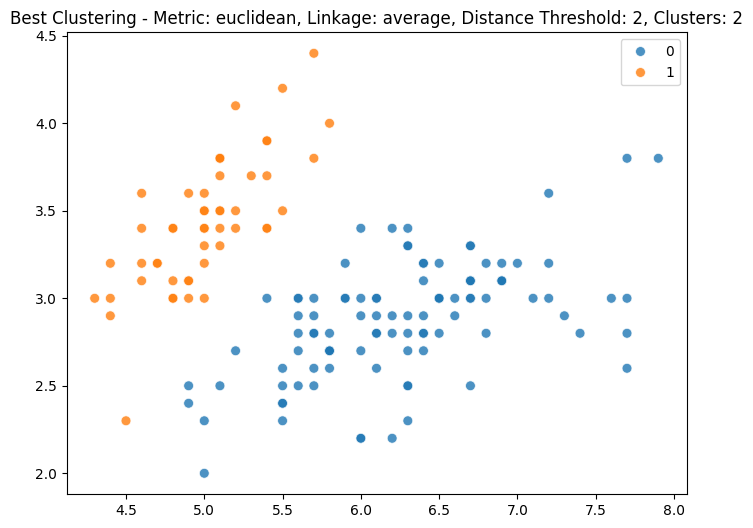

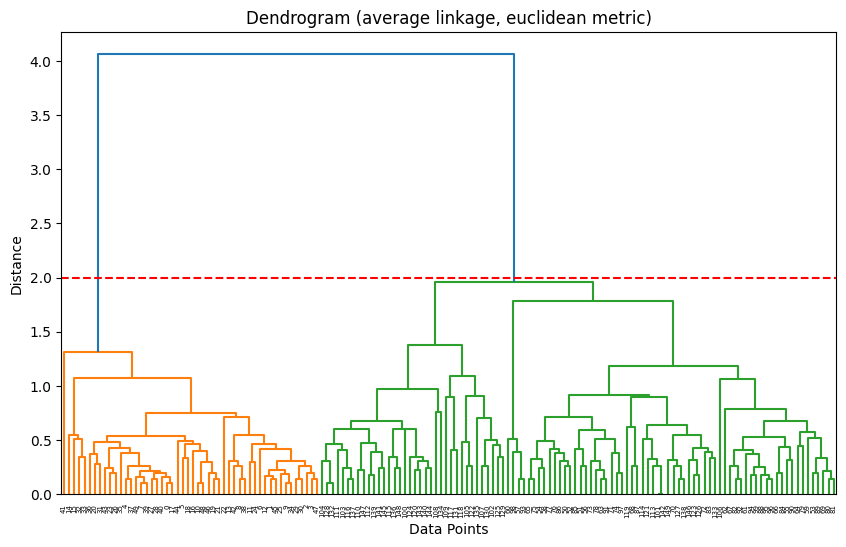

Best Parameters: {'metric': 'euclidean', 'linkage': 'average', 'distance_threshold': 2}
Best Silhouette Score: 0.6867
Number of clusters in best configuration: 2


In [ ]:
#Agolomarative on Synthetic Data on Non-Scaled Data
# Parameters to iterate over including Distance thresolds
metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['complete', 'average', 'single']
distance_thresholds = [1,2,3,4,5]

best_silhouette = -1
best_params = {}
best_labels = None
best_num_clusters = 0

# Loop through parameters
for metric in metrics:
    for linkage_method in linkages:
        for dist_thresh in distance_thresholds:
            try:
                # Ward linkage only works with Euclidean distance
                if linkage_method == 'ward' and metric != 'euclidean':
                    continue

                # Perform Agglomerative Clustering
                clustering = AgglomerativeClustering(
                    n_clusters=None, metric=metric, linkage=linkage_method, distance_threshold=dist_thresh
                )
                labels = clustering.fit_predict(X)
                num_clusters = len(set(labels))

                # Calculate silhouette score (only valid for more than 1 cluster)
                if num_clusters > 1:
                    sil_score = silhouette_score(X, labels)
                    print(f'Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {dist_thresh}, Clusters: {num_clusters}, Silhouette Score: {sil_score:.4f}')

                    # Track the best silhouette score
                    if sil_score > best_silhouette:
                        best_silhouette = sil_score
                        best_params = {'metric': metric, 'linkage': linkage_method, 'distance_threshold': dist_thresh}
                        best_labels = labels
                        best_num_clusters = num_clusters
            except Exception as e:
                print(f'Error with metric={metric}, linkage={linkage_method}, distance_threshold={dist_thresh}: {e}')

# Display the best clustering result
if best_labels is not None:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=best_labels, palette='tab10', s=50, alpha=0.8)
    plt.title(f'Best Clustering - Metric: {best_params["metric"]}, Linkage: {best_params["linkage"]}, Distance Threshold: {best_params["distance_threshold"]}, Clusters: {best_num_clusters}')
    plt.show()

from scipy.spatial.distance import pdist

if best_params:
    # Compute the linkage matrix with the best metric and linkage
    linked = linkage(pdist(X, metric=best_params['metric']), method=best_params['linkage'])

    plt.figure(figsize=(10, 6))
    dendrogram(linked, color_threshold=best_params['distance_threshold'])  # Color clusters at the distance threshold
    plt.axhline(y=best_params['distance_threshold'], color='r', linestyle='--')  # Draw the threshold line

    plt.title(f'Dendrogram ({best_params["linkage"]} linkage, {best_params["metric"]} metric)')
    plt.xlabel('Data Points')
    plt.ylabel('Distance')
    plt.show()

# Print the best parameters and silhouette score
print(f'Best Parameters: {best_params}')
print(f'Best Silhouette Score: {best_silhouette:.4f}')
print(f'Number of clusters in best configuration: {best_num_clusters}')

Silhouette Score: 0.554


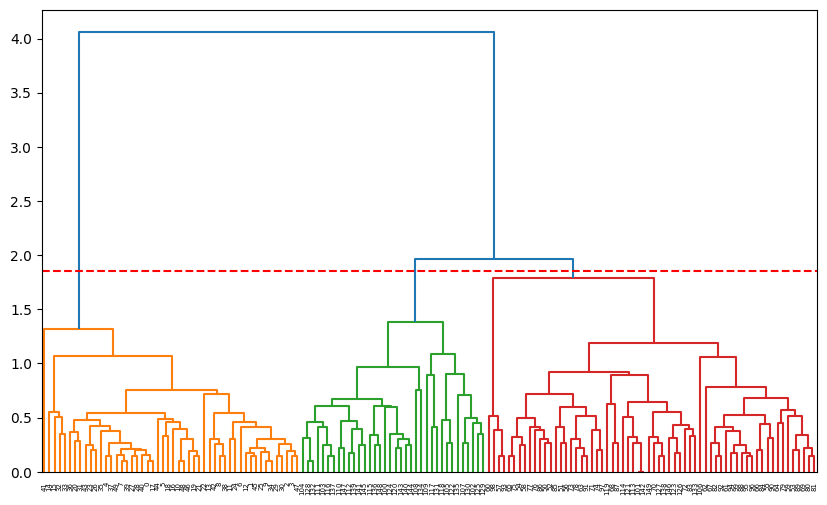

<Axes: >

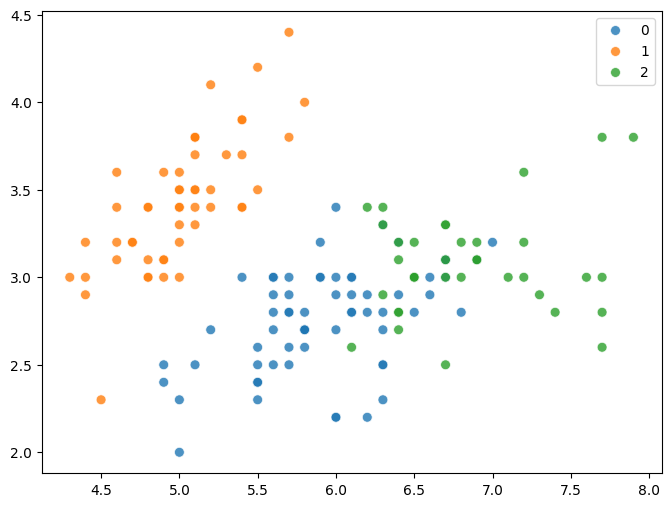

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import pdist

# Assuming X is your dataset (already defined)

# 1. Compute the linkage matrix with the best metric and linkage
linked = linkage(pdist(X, metric='euclidean'), method='average')

# 2. Plot the dendrogram
plt.figure(figsize=(10, 6))
dendrogram(linked, color_threshold=1.85)  # Color clusters at the distance threshold
plt.axhline(y=1.85, color='r', linestyle='--')  # Draw the threshold line

# 3. Perform Agglomerative Clustering
dist_thresh = 1.85  # Define the distance threshold
metric = 'euclidean'  # Use Euclidean distance
linkage_method = 'average'  # Use average linkage

# Perform Agglomerative Clustering with the specified parameters
clustering = AgglomerativeClustering(
    n_clusters=None,  # We do not specify the number of clusters, we use the distance threshold
    metric=metric,
    linkage=linkage_method,
    distance_threshold=dist_thresh  # Set the threshold for cluster formation
)

# Fit the model and get the labels (cluster assignments)
labels = clustering.fit_predict(X)

# Determine the number of clusters formed
num_clusters = len(set(labels))

# 4. Calculate silhouette score (only if more than 1 cluster is formed)
if num_clusters > 1:
    sil_score = silhouette_score(X, labels, metric='euclidean')
    print(f"Silhouette Score: {sil_score:.3f}")
else:
    print("Silhouette score cannot be computed for a single cluster.")

# Show the plot
plt.show()
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X[:, 0], y=X[:, 1], hue=labels, palette='tab10', s=50, alpha=0.8)



Metric: euclidean, Linkage: complete, Distance Threshold: 1, Clusters: 30, Silhouette Score: 0.2756
Metric: euclidean, Linkage: complete, Distance Threshold: 2, Clusters: 11, Silhouette Score: 0.3307
Metric: euclidean, Linkage: complete, Distance Threshold: 3, Clusters: 6, Silhouette Score: 0.3107
Metric: euclidean, Linkage: complete, Distance Threshold: 4, Clusters: 4, Silhouette Score: 0.4106
Metric: euclidean, Linkage: complete, Distance Threshold: 5, Clusters: 3, Silhouette Score: 0.4496
Metric: euclidean, Linkage: average, Distance Threshold: 1, Clusters: 17, Silhouette Score: 0.3009
Metric: euclidean, Linkage: average, Distance Threshold: 2, Clusters: 6, Silhouette Score: 0.3248
Metric: euclidean, Linkage: average, Distance Threshold: 3, Clusters: 3, Silhouette Score: 0.4803
Metric: euclidean, Linkage: single, Distance Threshold: 1, Clusters: 3, Silhouette Score: 0.5046
Metric: manhattan, Linkage: complete, Distance Threshold: 1, Clusters: 58, Silhouette Score: 0.2415
Metric: man

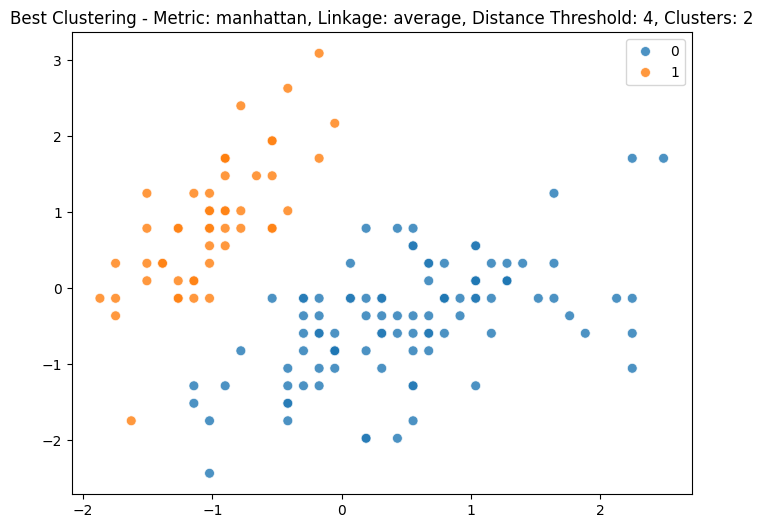

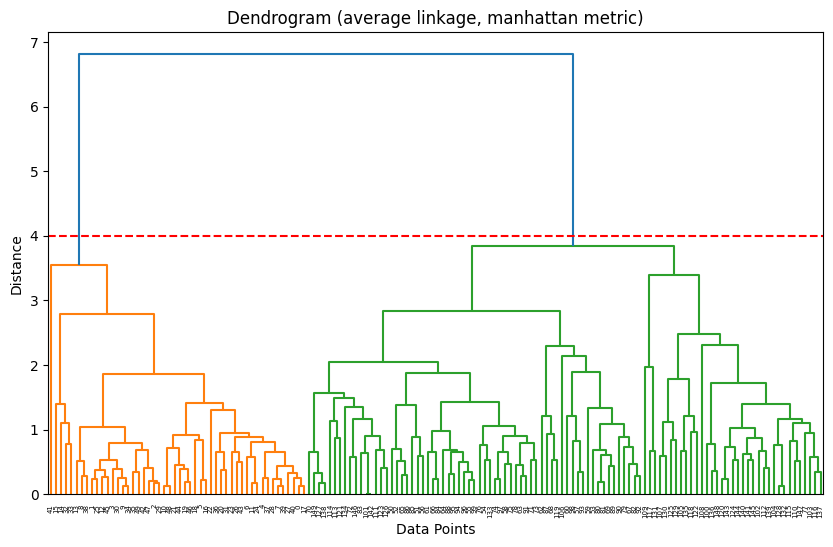

Best Parameters: {'metric': 'manhattan', 'linkage': 'average', 'distance_threshold': 4}
Best Silhouette Score: 0.5818
Number of clusters in best configuration: 2


In [ ]:
#Agolomarative on Synthetic Data Scaled Data
# Parameters to iterate over including Distance thresolds
metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['complete', 'average', 'single']
distance_thresholds = [1,2,3,4,5]

best_silhouette = -1
best_params = {}
best_labels = None
best_num_clusters = 0

# Loop through parameters
for metric in metrics:
    for linkage_method in linkages:
        for dist_thresh in distance_thresholds:
            try:
                # Ward linkage only works with Euclidean distance
                if linkage_method == 'ward' and metric != 'euclidean':
                    continue

                # Perform Agglomerative Clustering
                clustering = AgglomerativeClustering(
                    n_clusters=None, metric=metric, linkage=linkage_method, distance_threshold=dist_thresh
                )
                labels = clustering.fit_predict(X_scaled)
                num_clusters = len(set(labels))

                # Calculate silhouette score (only valid for more than 1 cluster)
                if num_clusters > 1:
                    sil_score = silhouette_score(X_scaled, labels)
                    print(f'Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {dist_thresh}, Clusters: {num_clusters}, Silhouette Score: {sil_score:.4f}')

                    # Track the best silhouette score
                    if sil_score > best_silhouette:
                        best_silhouette = sil_score
                        best_params = {'metric': metric, 'linkage': linkage_method, 'distance_threshold': dist_thresh}
                        best_labels = labels
                        best_num_clusters = num_clusters
            except Exception as e:
                print(f'Error with metric={metric}, linkage={linkage_method}, distance_threshold={dist_thresh}: {e}')

# Display the best clustering result
if best_labels is not None:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=best_labels, palette='tab10', s=50, alpha=0.8)
    plt.title(f'Best Clustering - Metric: {best_params["metric"]}, Linkage: {best_params["linkage"]}, Distance Threshold: {best_params["distance_threshold"]}, Clusters: {best_num_clusters}')
    plt.show()

from scipy.spatial.distance import pdist

if best_params:
    # Compute the linkage matrix with the best metric and linkage
    linked = linkage(pdist(X_scaled, metric=best_params['metric']), method=best_params['linkage'])

    plt.figure(figsize=(10, 6))
    dendrogram(linked, color_threshold=best_params['distance_threshold'])  # Color clusters at the distance threshold
    plt.axhline(y=best_params['distance_threshold'], color='r', linestyle='--')  # Draw the threshold line

    plt.title(f'Dendrogram ({best_params["linkage"]} linkage, {best_params["metric"]} metric)')
    plt.xlabel('Data Points')
    plt.ylabel('Distance')
    plt.show()

# Print the best parameters and silhouette score
print(f'Best Parameters: {best_params}')
print(f'Best Silhouette Score: {best_silhouette:.4f}')
print(f'Number of clusters in best configuration: {best_num_clusters}')

Best EPS: 0.8999999999999999, Best Min_samples: 5, Best Silhouette Score: 0.6867350732769777 , Number of Clusters: 2


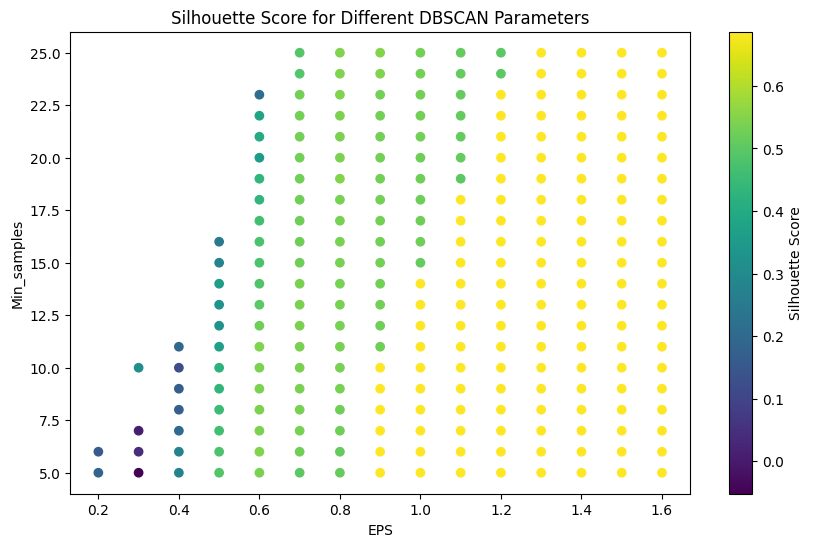

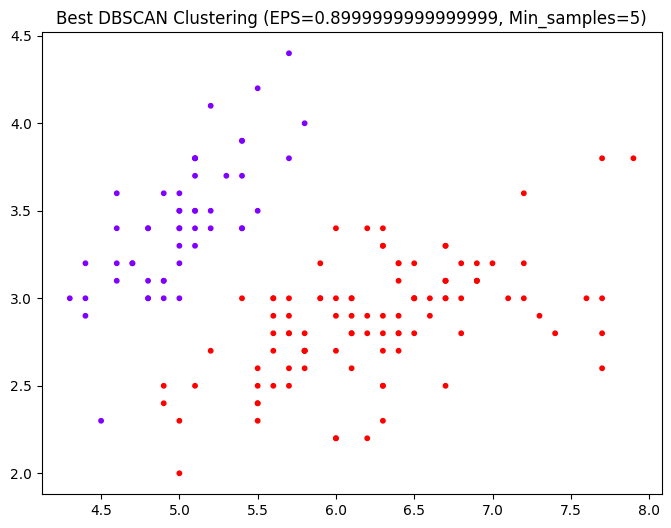

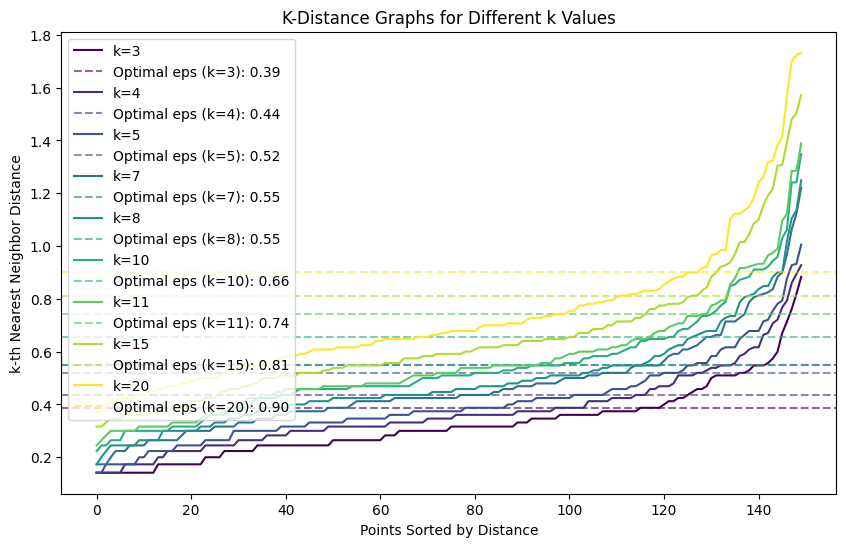

Optimal eps values for each k: {3: np.float64(0.38729833462074187), 4: np.float64(0.43588989435406744), 5: np.float64(0.5196152422706636), 7: np.float64(0.5477225575051662), 8: np.float64(0.5477225575051669), 10: np.float64(0.6557438524302004), 11: np.float64(0.7416198487095665), 15: np.float64(0.8124038404635958), 20: np.float64(0.9000000000000002)}


In [ ]:
#DBSCAN ON Synthetic Data on Non Scaled Data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
# Range of EPS and Min_samples values to test
eps_values = np.linspace(0.1, 3, 30)  # 30 values from 0.1 to 3
min_samples_values = range(5, 26)  # From 5 to 25

best_score = -1
best_params = None
best_labels = None
best_model = None
num_clusters_dict = {}

# Loop over different combinations of EPS and Min_samples
silhouette_scores = []
param_combinations = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X)

        # Count number of clusters (excluding noise)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Only evaluate silhouette score if there are at least 2 clusters
        if num_clusters > 1:
            score = silhouette_score(X, labels)
            silhouette_scores.append(score)
            param_combinations.append((eps, min_samples))
            num_clusters_dict[(eps, min_samples)] = num_clusters

            if score > best_score:
                best_score = score
                best_params = (eps, min_samples,num_clusters)
                best_labels = labels
                best_model = dbscan

# Extracting the best parameters
eps_best, min_samples_best,num_clusters = best_params
print(f"Best EPS: {eps_best}, Best Min_samples: {min_samples_best}, Best Silhouette Score: {best_score} , Number of Clusters: {num_clusters}")

# Plot silhouette scores
fig = plt.figure(figsize=(10, 6))
plt.scatter([p[0] for p in param_combinations], [p[1] for p in param_combinations], c=silhouette_scores, cmap='viridis', marker='o')
plt.colorbar(label='Silhouette Score')
plt.xlabel('EPS')
plt.ylabel('Min_samples')
plt.title('Silhouette Score for Different DBSCAN Parameters')
plt.show()

# Plot best clusters
plt.figure(figsize=(8, 6))
plt.scatter(X[:, 0], X[:, 1], c=best_labels, cmap='rainbow', s=10)
plt.title(f'Best DBSCAN Clustering (EPS={eps_best}, Min_samples={min_samples_best})')
plt.show()

def find_elbow_point(distances):
    """Alternative method to find the elbow point using the maximum curvature."""
    n_points = len(distances)
    all_coords = np.vstack((range(n_points), distances)).T

    # Define a line from the first to the last point
    first_point = all_coords[0]
    last_point = all_coords[-1]
    line_vec = last_point - first_point
    line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))

    # Compute distances to the line (perpendicular distance)
    vec_from_first = all_coords - first_point
    scalar_product = np.sum(vec_from_first * line_vec_norm, axis=1)
    vec_proj = np.outer(scalar_product, line_vec_norm)
    perpendicular_vec = vec_from_first - vec_proj
    distances_to_line = np.sqrt(np.sum(perpendicular_vec**2, axis=1))

    elbow_index = np.argmax(distances_to_line)
    return elbow_index, distances[elbow_index]

def plot_k_distance_graphs(data, k_values):
    plt.figure(figsize=(10, 6))
    optimal_eps_values = {}

    # Define color map for different k values
    colors = plt.cm.viridis(np.linspace(0, 1, len(k_values)))

    for i, (k, color) in enumerate(zip(k_values, colors)):
        # Compute the k-distance
        neigh = NearestNeighbors(n_neighbors=k)
        neigh.fit(data)
        distances, _ = neigh.kneighbors(data)

        # Sort the k-th nearest neighbor distance in ascending order
        k_distances = np.sort(distances[:, k - 1])

        # Find the elbow point using the max curvature method
        elbow_index, optimal_eps = find_elbow_point(k_distances)
        optimal_eps_values[k] = optimal_eps

        # Plot all graphs in one figure
        plt.plot(range(len(k_distances)), k_distances, label=f'k={k}', color=color)
        if optimal_eps is not None:
            plt.axhline(y=optimal_eps, color=color, linestyle='--', alpha=0.6, label=f'Optimal eps (k={k}): {optimal_eps:.2f}')

    plt.xlabel("Points Sorted by Distance")
    plt.ylabel("k-th Nearest Neighbor Distance")
    plt.title("K-Distance Graphs for Different k Values")
    plt.legend()
    plt.show()

    return optimal_eps_values


# List of k values to test
k_values = [3,4, 5, 7,8, 10,11, 15, 20]

# Generate K-Distance Graphs and get optimal eps values
optimal_eps_values = plot_k_distance_graphs(X, k_values)
print("Optimal eps values for each k:", optimal_eps_values)

Best EPS: 1.4, Best Min_samples: 5, Best Silhouette Score: 0.5817500491982808 , Number of Clusters: 2


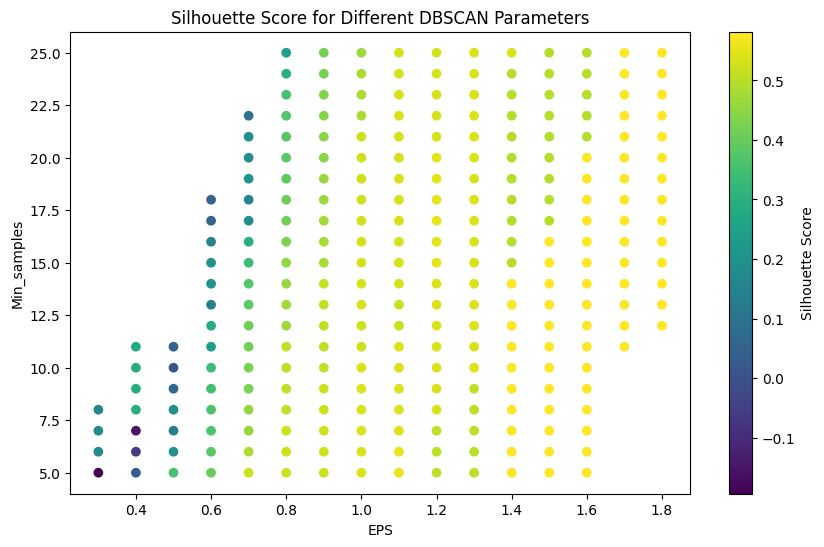

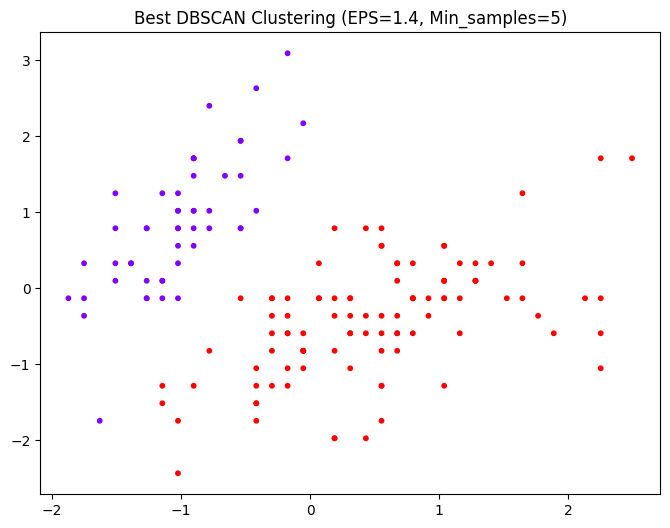

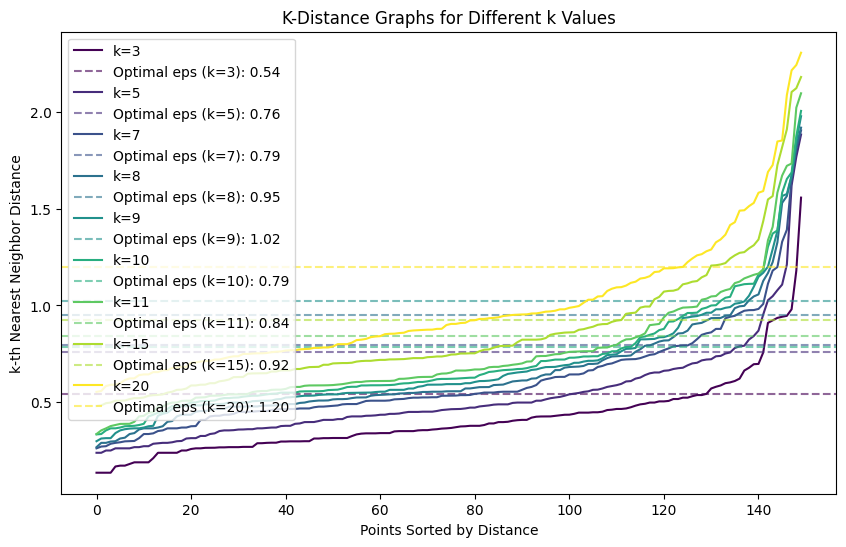

Optimal eps values for each k: {3: np.float64(0.5423949713451736), 5: np.float64(0.756746151157223), 7: np.float64(0.7929131488675982), 8: np.float64(0.9482638449626213), 9: np.float64(1.0208945267460194), 10: np.float64(0.7860481360779492), 11: np.float64(0.8429875010641378), 15: np.float64(0.9247082495834228), 20: np.float64(1.1995702272290965)}


In [ ]:
#DBSCAN ON Synthetic Data on Scaled Data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
# Range of EPS and Min_samples values to test
eps_values = np.linspace(0.1, 3, 30)  # 30 values from 0.1 to 3
min_samples_values = range(5, 26)  # From 5 to 25

best_score = -1
best_params = None
best_labels = None
best_model = None
num_clusters_dict = {}

# Loop over different combinations of EPS and Min_samples
silhouette_scores = []
param_combinations = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)

        # Count number of clusters (excluding noise)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Only evaluate silhouette score if there are at least 2 clusters
        if num_clusters > 1:
            score = silhouette_score(X_scaled, labels)
            silhouette_scores.append(score)
            param_combinations.append((eps, min_samples))
            num_clusters_dict[(eps, min_samples)] = num_clusters

            if score > best_score:
                best_score = score
                best_params = (eps, min_samples,num_clusters)
                best_labels = labels
                best_model = dbscan

# Extracting the best parameters
eps_best, min_samples_best,num_clusters = best_params
print(f"Best EPS: {eps_best}, Best Min_samples: {min_samples_best}, Best Silhouette Score: {best_score} , Number of Clusters: {num_clusters}")

# Plot silhouette scores
fig = plt.figure(figsize=(10, 6))
plt.scatter([p[0] for p in param_combinations], [p[1] for p in param_combinations], c=silhouette_scores, cmap='viridis', marker='o')
plt.colorbar(label='Silhouette Score')
plt.xlabel('EPS')
plt.ylabel('Min_samples')
plt.title('Silhouette Score for Different DBSCAN Parameters')
plt.show()

# Plot best clusters
plt.figure(figsize=(8, 6))
plt.scatter(X_scaled[:, 0], X_scaled[:, 1], c=best_labels, cmap='rainbow', s=10)
plt.title(f'Best DBSCAN Clustering (EPS={eps_best}, Min_samples={min_samples_best})')
plt.show()

def find_elbow_point(distances):
    """Alternative method to find the elbow point using the maximum curvature."""
    n_points = len(distances)
    all_coords = np.vstack((range(n_points), distances)).T

    # Define a line from the first to the last point
    first_point = all_coords[0]
    last_point = all_coords[-1]
    line_vec = last_point - first_point
    line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))

    # Compute distances to the line (perpendicular distance)
    vec_from_first = all_coords - first_point
    scalar_product = np.sum(vec_from_first * line_vec_norm, axis=1)
    vec_proj = np.outer(scalar_product, line_vec_norm)
    perpendicular_vec = vec_from_first - vec_proj
    distances_to_line = np.sqrt(np.sum(perpendicular_vec**2, axis=1))

    elbow_index = np.argmax(distances_to_line)
    return elbow_index, distances[elbow_index]

def plot_k_distance_graphs(data, k_values):
    plt.figure(figsize=(10, 6))
    optimal_eps_values = {}

    # Define color map for different k values
    colors = plt.cm.viridis(np.linspace(0, 1, len(k_values)))

    for i, (k, color) in enumerate(zip(k_values, colors)):
        # Compute the k-distance
        neigh = NearestNeighbors(n_neighbors=k)
        neigh.fit(data)
        distances, _ = neigh.kneighbors(data)

        # Sort the k-th nearest neighbor distance in ascending order
        k_distances = np.sort(distances[:, k - 1])

        # Find the elbow point using the max curvature method
        elbow_index, optimal_eps = find_elbow_point(k_distances)
        optimal_eps_values[k] = optimal_eps

        # Plot all graphs in one figure
        plt.plot(range(len(k_distances)), k_distances, label=f'k={k}', color=color)
        if optimal_eps is not None:
            plt.axhline(y=optimal_eps, color=color, linestyle='--', alpha=0.6, label=f'Optimal eps (k={k}): {optimal_eps:.2f}')

    plt.xlabel("Points Sorted by Distance")
    plt.ylabel("k-th Nearest Neighbor Distance")
    plt.title("K-Distance Graphs for Different k Values")
    plt.legend()
    plt.show()

    return optimal_eps_values


# List of k values to test
k_values = [3, 5, 7,8,9, 10,11, 15, 20]

# Generate K-Distance Graphs and get optimal eps values
optimal_eps_values = plot_k_distance_graphs(X_scaled, k_values)
print("Optimal eps values for each k:", optimal_eps_values)



**First Plot: k-Distance Graph Approach**

The
k-distance graph helps determine the optimal EPS by plotting the sorted distances to the
k-th nearest neighbor. The point where the curve shows a significant jump (elbow point) is considered the optimal EPS.


**Second Plot: Iterative Search Approach**

The second method involves iterating over different EPS and min_samples values to maximize clustering performance.

The best combination found was EPS = 1.4 and min_samples = 5 based on a metric like silhouette score or cluster coherence.

**Reasons for the Difference:**

**Dataset Density and Distribution**

The
k-distance graph assumes a sharp jump indicates an ideal cluster separation, but this is not always the best clustering threshold.

If the dataset has overlapping or non-uniform densities, the elbow method might suggest an EPS that is too small, leading to excessive noise points.

A larger EPS (1.4) might capture more meaningful clusters, even if it does not align with the knee-point.

**Effect of k choice in k-distance Graph**

The choice of
k=4 influences the elbow detection.

Different k values might have resulted in a different elbow position.

**Silhouette Score and Cluster Quality**

The elbow method only looks at the neighborhood distances, while the iterative approach evaluates the quality of the formed clusters.

EPS = 0.44 may lead to fragmented clusters, which perform worse in silhouette scoring.

EPS = 1.4, min_samples = 5 might have provided better-separated clusters.

**Final Conclusion:**
Best approach: Hierarchical clustering (Non-Scaled)

**Reason:** It achieved the highest silhouette score (0.6867) and preserved natural clusters.

Scaling is not beneficial in this case, as it reduced clustering performance for all methods.

**Notes**

**Non-Scaled Data** Performs Better: Since the silhouette score is higher for non-scaled data, it’s better to use unscaled features when clustering this dataset.

**Hierarchical Clustering (Non-Scaled)** is the Best Choice: It achieves the highest silhouette score (0.6867) and does not require pre-selecting clusters.

Scaling Negatively Impacts Performance: It distorts distances, leading to overlapping clusters and lower silhouette scores.

# **Customer Dataset**

In [ ]:
df = pd.read_csv(r'/content/Customer data.csv')
df.head()

,ID,Sex,Marital status,Age,Education,Income,Occupation,Settlement size
0,100000001,0,0,67,2,124670,1,2
1,100000002,1,1,22,1,150773,1,2
2,100000003,0,0,49,1,89210,0,0
3,100000004,0,0,45,1,171565,1,1
4,100000005,0,0,53,1,149031,1,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype
---  ------           --------------  -----
 0   ID               2000 non-null   int64
 1   Sex              2000 non-null   int64
 2   Marital status   2000 non-null   int64
 3   Age              2000 non-null   int64
 4   Education        2000 non-null   int64
 5   Income           2000 non-null   int64
 6   Occupation       2000 non-null   int64
 7   Settlement size  2000 non-null   int64
dtypes: int64(8)
memory usage: 125.1 KB


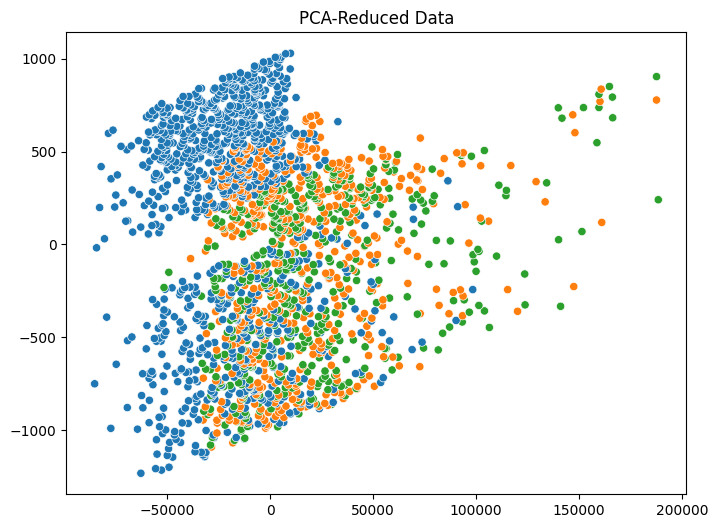

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
import pandas as pd

# Assuming 'df' is your dataframe

# Separate features (X) and target variable (y)
X = df.iloc[:, :-1].values  # All columns except the last one (features)
y = df.iloc[:, -1].values   # Last column (target variable)

# Apply PCA to reduce X to 2 dimensions
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X)

# Now, you can call the display_cluster function with the reduced 2D data
display_cluster(X_pca, y, title="PCA-Reduced Data")


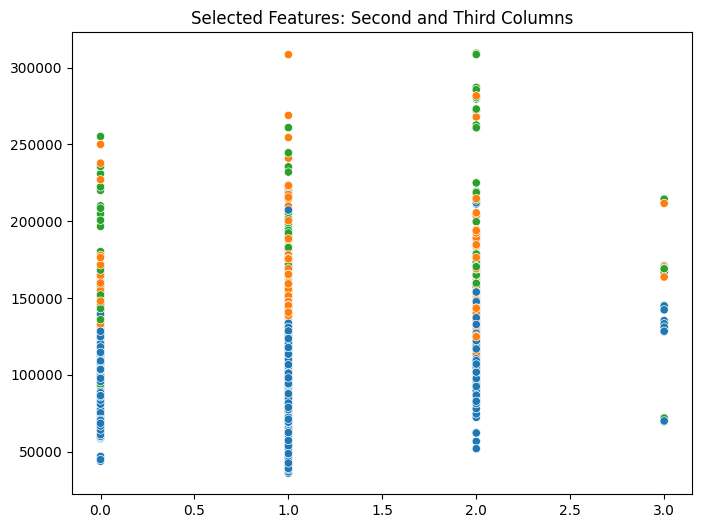

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming 'df' is your dataframe

# Extract the second and third columns for X (features)
X = df.iloc[:, 4:6].values  # Columns 2 and 3 (index 1 and 2)

# Extract the last column for y (target labels)
y = df.iloc[:, -1].values  # Last column (target variable)

# Now call the display_cluster function with the selected 2 features
display_cluster(X, y, title="Selected Features: Second and Third Columns")


In [ ]:
df = df.drop(columns=["ID"])


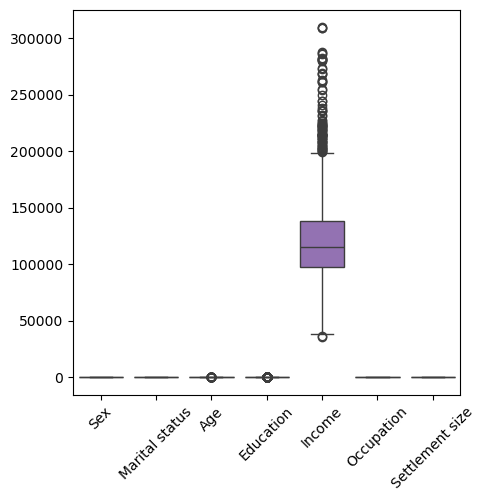

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(5, 5))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.show()

In [ ]:
import numpy as np

upper_limit = np.percentile(df["Income"], 95)
df = df[df["Income"] <= upper_limit]  # Keep only reasonable values

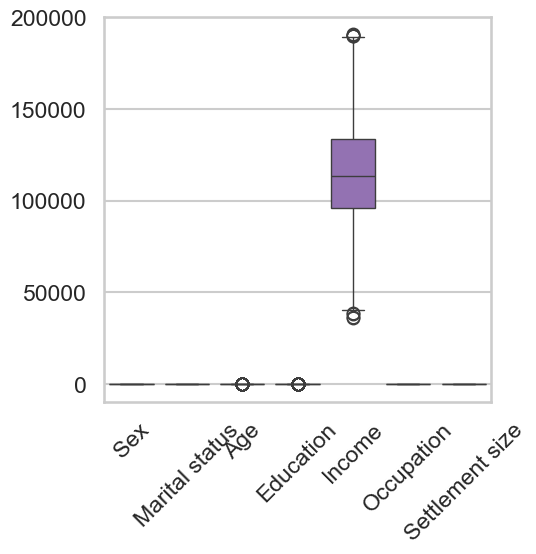

In [ ]:
plt.figure(figsize=(5, 5))
sns.boxplot(data=df)
plt.xticks(rotation=45)
plt.show()

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(df)
X_scaled


array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        3.24781013e-01, 5.00000000e-01, 1.00000000e+00],
       [5.00250120e-04, 1.00000000e+00, 1.00000000e+00, ...,
        4.20210432e-01, 5.00000000e-01, 1.00000000e+00],
       [1.00050025e-03, 0.00000000e+00, 0.00000000e+00, ...,
        1.95143530e-01, 0.00000000e+00, 0.00000000e+00],
       ...,
       [9.98999500e-01, 0.00000000e+00, 0.00000000e+00, ...,
        1.84870509e-01, 0.00000000e+00, 0.00000000e+00],
       [9.99499750e-01, 1.00000000e+00, 1.00000000e+00, ...,
        2.27161721e-01, 0.00000000e+00, 0.00000000e+00],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.19123174e-01, 0.00000000e+00, 0.00000000e+00]])

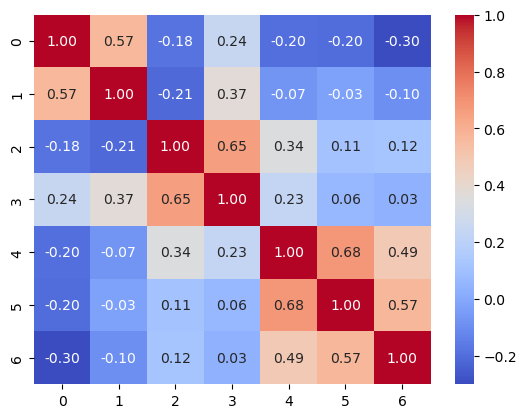

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = pd.DataFrame(X_scaled).corr()
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.show()


In [ ]:
import matplotlib.pyplot as plt

def display_cluster2(X, labels, centers=None, title="Cluster Visualization"):
    """
    X: 2D data points (after PCA)
    labels: Cluster labels from KMeans
    centers: Cluster centroids (optional)
    """
    plt.figure(figsize=(6, 6))

    # Scatter plot of points, colored by their cluster labels
    plt.scatter(X[:, 2], X[:, 4], c=labels, cmap='rainbow', alpha=0.6)

    # Plot cluster centers if provided
    if centers is not None:
        plt.scatter(centers[:, 2], centers[:, 4], c='black', marker='x', s=200, label="Centroids")

    plt.title(title)
    plt.legend()
    plt.show()


In [ ]:
# Apply PCA for visualization
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(X_scaled)  # Transform to 2D

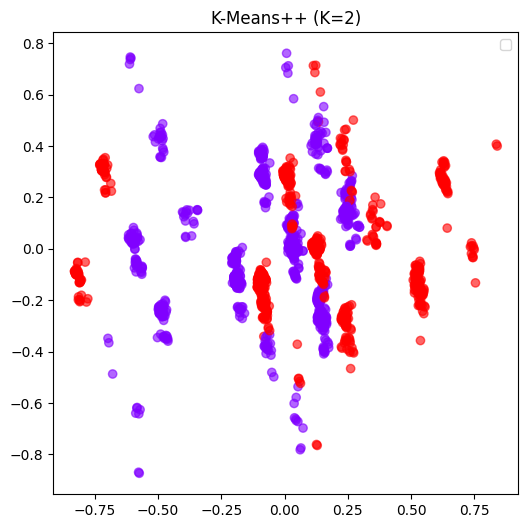

K=2, Silhouette Score: 0.3855


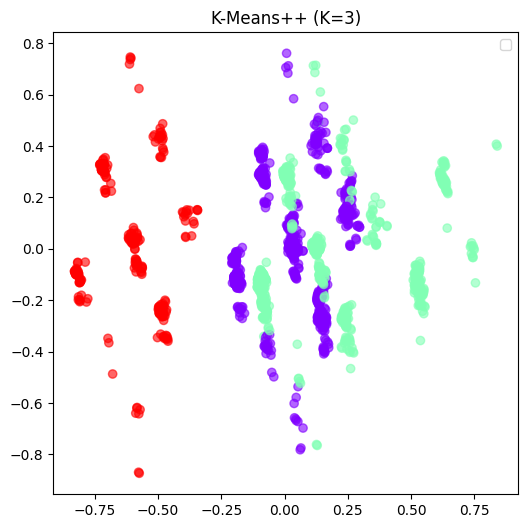

K=3, Silhouette Score: 0.3700


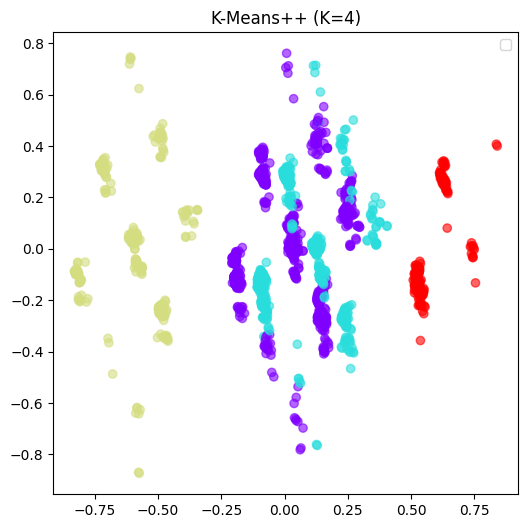

K=4, Silhouette Score: 0.4036


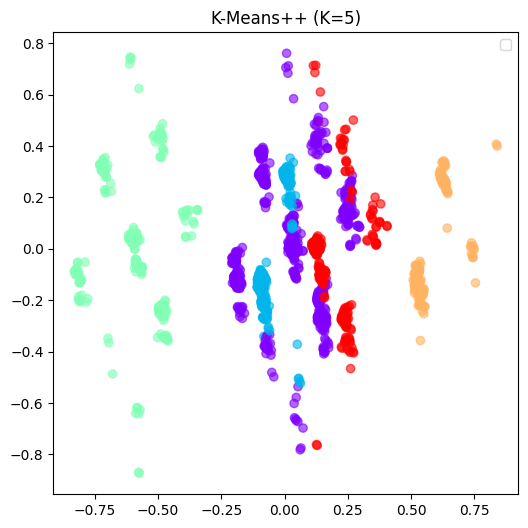

K=5, Silhouette Score: 0.4100


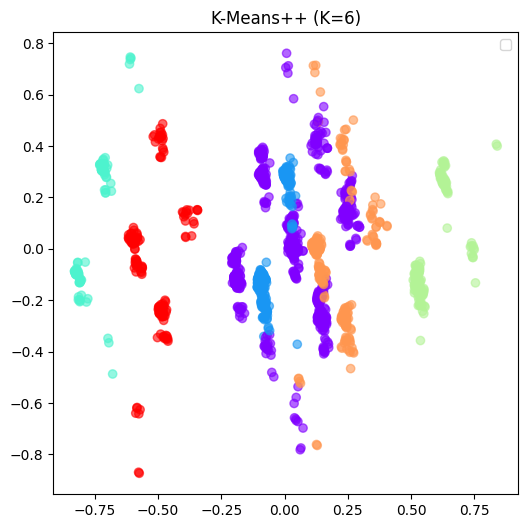

K=6, Silhouette Score: 0.4062


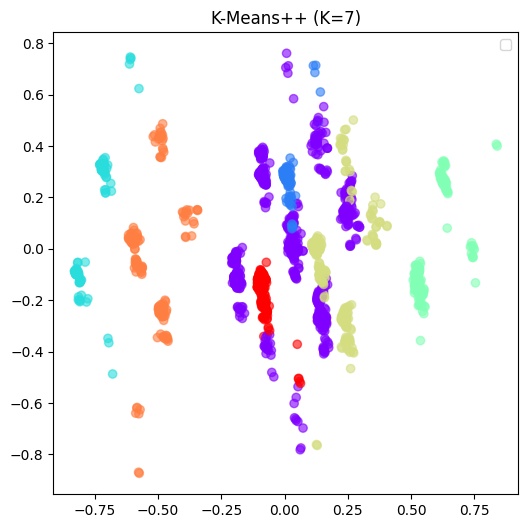

K=7, Silhouette Score: 0.4015


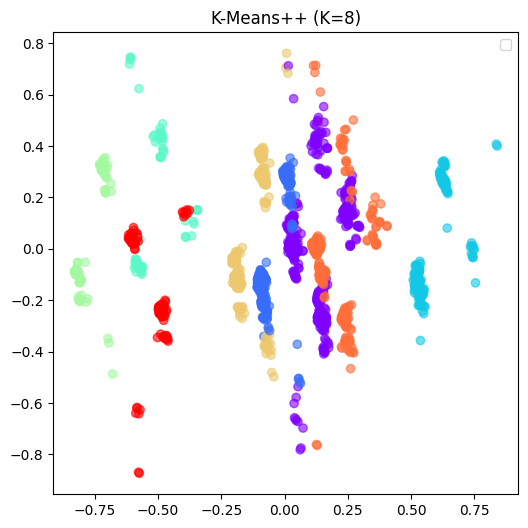

K=8, Silhouette Score: 0.4392


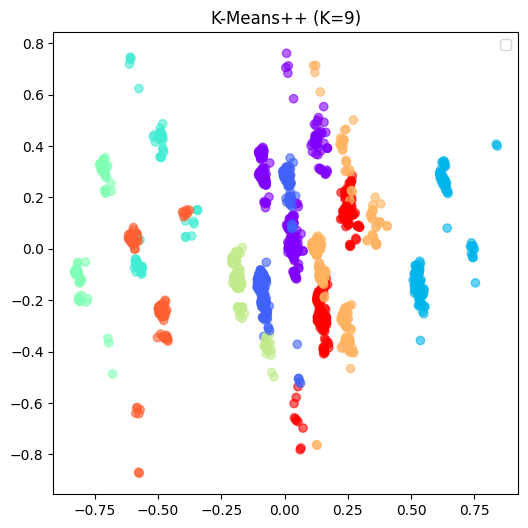

K=9, Silhouette Score: 0.4151


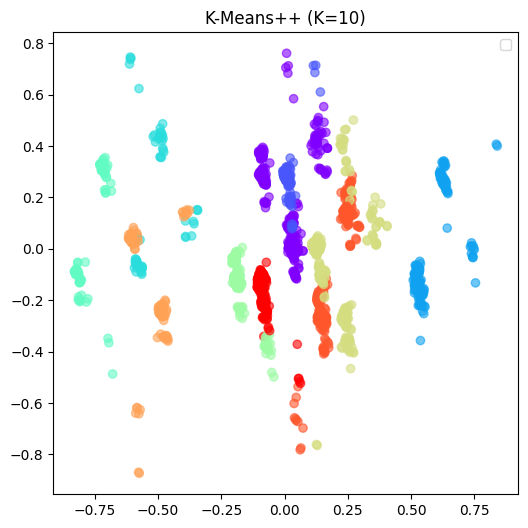

K=10, Silhouette Score: 0.4115


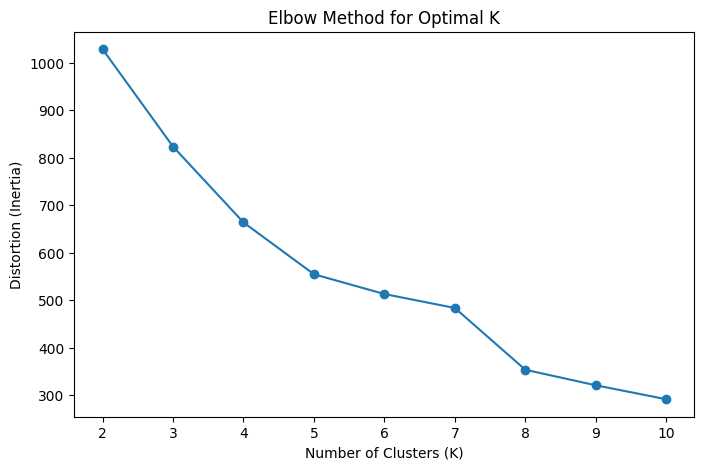

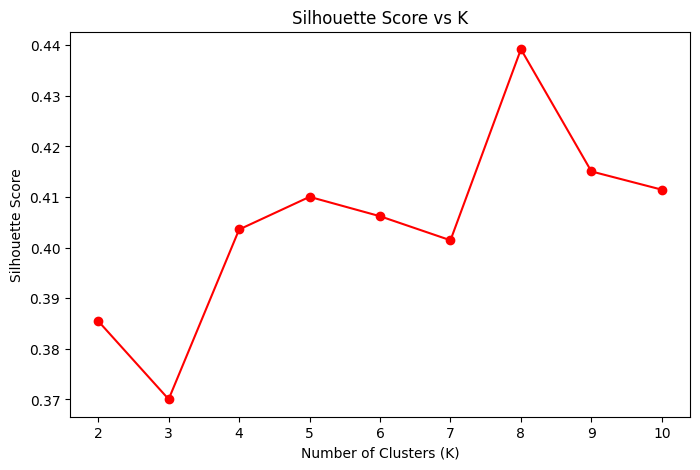

Best K chosen: 8 with Silhouette Score: 0.4392


In [ ]:
# K-Means Clustering with different K values on Scaled Data
distortions = []
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans_labels = kmeans.fit_predict(X_scaled)

    distortions.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, kmeans_labels))

    # Display clusters
    display_cluster2(X_pca, kmeans_labels, title=f"K-Means++ (K={k})")

    print(f"K={k}, Silhouette Score: {silhouette_scores[-1]:.4f}")

# Plot distortion function versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, distortions, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Distortion (Inertia)")
plt.title("Elbow Method for Optimal K")
plt.show()

# Plot silhouette_score versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', color='r')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs K")
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
best_silhouette_score = max(silhouette_scores)
print(f"Best K chosen: {best_k} with Silhouette Score: {best_silhouette_score:.4f}")


K=2, Silhouette Score: 0.5834
K=3, Silhouette Score: 0.5116
K=4, Silhouette Score: 0.5430
K=5, Silhouette Score: 0.5406
K=6, Silhouette Score: 0.5409
K=7, Silhouette Score: 0.5346
K=8, Silhouette Score: 0.5408
K=9, Silhouette Score: 0.5174
K=10, Silhouette Score: 0.5222


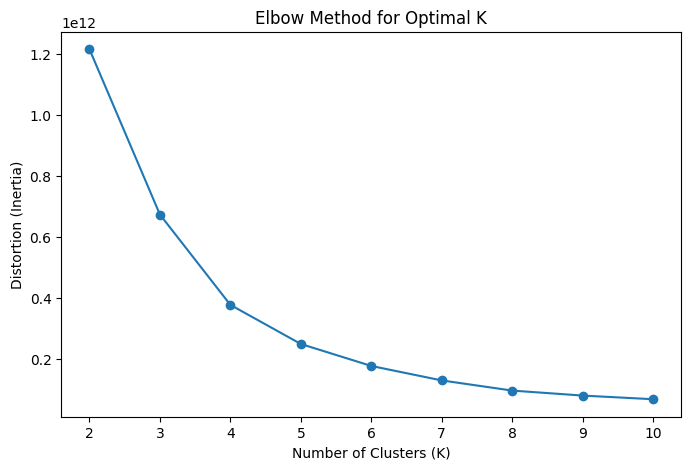

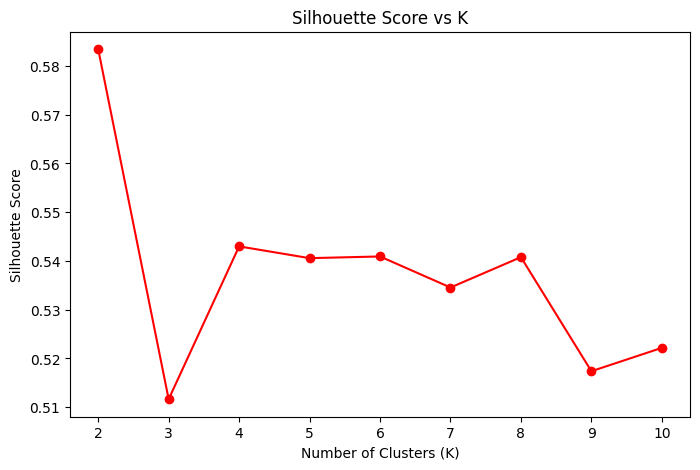

Best K chosen: 2 with Silhouette Score: 0.5834


In [ ]:
# K-Means Clustering with different K values Plotting using the features directly not PCA [used features at indices 2 and 4]
# Non Scaled Data
distortions = []
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans_labels = kmeans.fit_predict(df)

    distortions.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(df, kmeans_labels))

    # Display clusters
    #display_cluster(X_pca, kmeans_labels,kmeans.cluster_centers_, title=f"K-Means++ (K={k})")

    print(f"K={k}, Silhouette Score: {silhouette_scores[-1]:.4f}")

# Plot distortion function versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, distortions, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Distortion (Inertia)")
plt.title("Elbow Method for Optimal K")
plt.show()

# Plot silhouette_score versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', color='r')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs K")
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
best_silhouette_score = max(silhouette_scores)
print(f"Best K chosen: {best_k} with Silhouette Score: {best_silhouette_score:.4f}")


**Explanation of why MinMax Scaling resulted in higher Sil scores than StandardScalar:**
**Categorical Variables**: Some of the columns, such as Sex, Marital status, Education, Occupation, and Settlement size, are categorical in nature. StandardScaler might not handle these effectively since they don't have a natural "mean" or "standard deviation" to scale. MinMax Scaling, on the other hand, can more easily transform categorical data into numerical values within a fixed range, ensuring that K-Means can treat all features equally when forming clusters.

**Explanation of how scaling caused an increase in K from 2 to 8 after scaling:**

-->**Visualizing the Effect:**
You might visualize this by thinking of the data as a cloud of points in multi-dimensional space (each dimension representing one of the features).

Without scaling, the cloud may be elongated in the Income direction, causing the clustering algorithm to focus mostly on that dimension.

With scaling, the cloud becomes more spherical because all features contribute equally, and the algorithm can now more effectively separate the data along multiple axes (not just along the Income axis).

-->**Over-segmentation Risk:**

While scaling can reveal more subtle differences and lead to more clusters, it can also result in over-segmentation.

Over-segmentation happens when the algorithm creates too many clusters that don't actually represent meaningful differences in the data. This might explain why 8 clusters were found after scaling, which could be an overfit result where the algorithm detects too many fine distinctions that do not correspond to real-world divisions in the data.

**Why the Silhouette Score is Higher without Scaling:**

Feature Imbalance: Without scaling, Income (which has a larger range) could dominate the distance calculations, and the algorithm may be able to more easily separate the data into two broad clusters based on Income. This results in better-defined clusters, leading to a higher Silhouette score.

Fewer Clusters, Better Cohesion: With fewer clusters (2 clusters), K-Means can focus on larger differences in Income and separate the data more clearly, as there is less "noise" from other smaller-scale features.

**Why the Silhouette Score is Lower with Scaling:**

--> **Overfitting with Many Clusters**: After scaling, all features contribute equally to the distance calculation. K-Means may find more clusters (8 in this case), but these clusters may be based on subtler, less meaningful distinctions between data points.

--> **Distortion from Scaled Features**: The scaling might lead to an oversegmentation of the data. Because features like Income, which have large ranges, are now on a similar scale as other features like Sex or Marital status, the algorithm may create more clusters that don't have significant real-world differences.

--> **Lower Cohesion in Small Clusters**: In the case of 8 clusters, some of the clusters may have fewer data points, leading to less cohesive clusters and a lower Silhouette score. This means that points in those small clusters may be closer to points in other clusters, resulting in a worse score.


In [ ]:
#Silhouette score is too low so I am trying to modify the features used in clustering.


In [ ]:
# Silhouette score is too low so I am trying to select speciffic features to perform scaling on.
#First I tried toperform kmeans on PCA reduced data not all the features.

Metric: manhattan, Linkage: complete, Distance Threshold: 3.0, Clusters: 12, Silhouette Score: 0.3685
Metric: manhattan, Linkage: complete, Distance Threshold: 3.1, Clusters: 11, Silhouette Score: 0.3719
Metric: manhattan, Linkage: complete, Distance Threshold: 3.2, Clusters: 10, Silhouette Score: 0.3913
Metric: manhattan, Linkage: complete, Distance Threshold: 3.3000000000000003, Clusters: 9, Silhouette Score: 0.4058
Metric: manhattan, Linkage: complete, Distance Threshold: 3.4000000000000004, Clusters: 8, Silhouette Score: 0.4067
Metric: manhattan, Linkage: complete, Distance Threshold: 3.5000000000000004, Clusters: 8, Silhouette Score: 0.4067
Metric: manhattan, Linkage: complete, Distance Threshold: 3.6000000000000005, Clusters: 8, Silhouette Score: 0.4067
Metric: manhattan, Linkage: complete, Distance Threshold: 3.7000000000000006, Clusters: 7, Silhouette Score: 0.4209
Metric: manhattan, Linkage: complete, Distance Threshold: 3.8000000000000007, Clusters: 6, Silhouette Score: 0.424

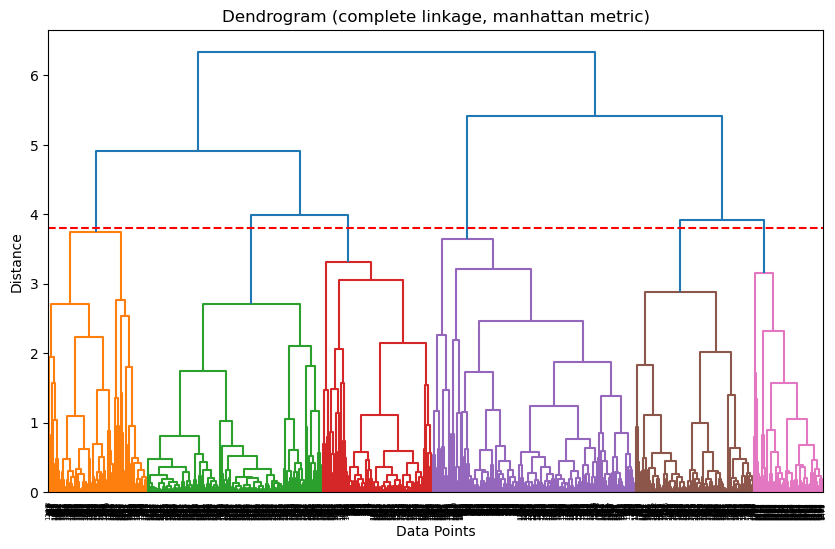

Best Parameters: {'metric': 'manhattan', 'linkage': 'complete', 'distance_threshold': 3.8000000000000007}
Best Silhouette Score: 0.4240
Number of clusters in best configuration: 6


In [ ]:
#Agolomarative on Synthetic Data on Scaled Data
# Parameters to iterate over including Distance thresolds
metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['complete', 'average', 'single']
distance_thresholds = np.arange(3, 5.1, 0.1).tolist()
best_silhouette = -1
best_params = {}
best_labels = None
best_num_clusters = 0

# Loop through parameters
for metric in metrics:
    for linkage_method in linkages:
        for dist_thresh in distance_thresholds:
            try:
                # Ward linkage only works with Euclidean distance
                if linkage_method == 'ward' and metric != 'euclidean':
                    continue

                # Perform Agglomerative Clustering
                clustering = AgglomerativeClustering(
                    n_clusters=None, metric=metric, linkage=linkage_method, distance_threshold=dist_thresh
                )
                labels = clustering.fit_predict(X_scaled)
                num_clusters = len(set(labels))

                # Calculate silhouette score (only valid for more than 1 cluster)
                if num_clusters > 1:
                    sil_score = silhouette_score(X_scaled, labels)
                    print(f'Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {dist_thresh}, Clusters: {num_clusters}, Silhouette Score: {sil_score:.4f}')

                    # Track the best silhouette score
                    if sil_score > best_silhouette:
                        best_silhouette = sil_score
                        best_params = {'metric': metric, 'linkage': linkage_method, 'distance_threshold': dist_thresh}
                        best_labels = labels
                        best_num_clusters = num_clusters
            except Exception as e:
                print(f'Error with metric={metric}, linkage={linkage_method}, distance_threshold={dist_thresh}: {e}')

# Display the best clustering result
#if best_labels is not None:
    #plt.figure(figsize=(8, 6))
    #sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=best_labels, palette='tab10', s=50, alpha=0.8)
    #plt.title(f'Best Clustering - Metric: {best_params["metric"]}, Linkage: {best_params["linkage"]}, Distance Threshold: {best_params["distance_threshold"]}, Clusters: {best_num_clusters}')
    #plt.show()

from scipy.spatial.distance import pdist

if best_params:
    # Compute the linkage matrix with the best metric and linkage
    linked = linkage(pdist(X_scaled, metric='cityblock'), method=best_params['linkage'])

    plt.figure(figsize=(10, 6))
    dendrogram(linked, color_threshold=best_params['distance_threshold'])  # Color clusters at the distance threshold
    plt.axhline(y=best_params['distance_threshold'], color='r', linestyle='--')  # Draw the threshold line

    plt.title(f'Dendrogram ({best_params["linkage"]} linkage, {best_params["metric"]} metric)')
    plt.xlabel('Data Points')
    plt.ylabel('Distance')
    plt.show()

# Print the best parameters and silhouette score
print(f'Best Parameters: {best_params}')
print(f'Best Silhouette Score: {best_silhouette:.4f}')
print(f'Number of clusters in best configuration: {best_num_clusters}')

Metric: euclidean, Linkage: complete, Distance Threshold: 50000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 51000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 52000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 53000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 54000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 55000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 56000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 57000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 58000, Clusters: 7, Silhouette Score: 0.4567
Metric: euclidean, Linkage: complete, Distance Threshold: 59000, Clusters

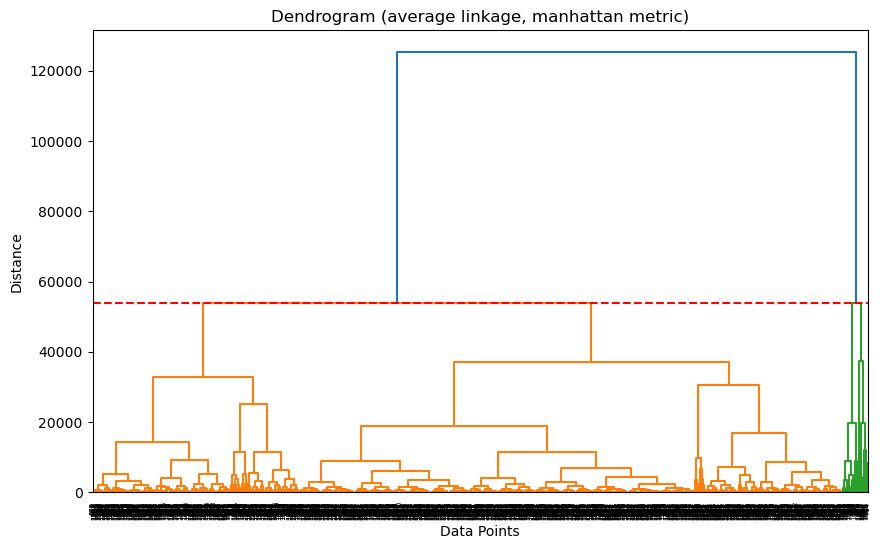

Best Parameters: {'metric': 'manhattan', 'linkage': 'average', 'distance_threshold': 54000}
Best Silhouette Score: 0.6858
Number of clusters in best configuration: 2


In [ ]:
#Agolomarative on Non-Scaled Data
# Parameters to iterate over including Distance thresolds
metrics = ['euclidean', 'manhattan', 'cosine']
linkages = ['complete', 'average', 'single']
distance_thresholds = np.arange(50000, 60000, 1000).tolist()
best_silhouette = -1
best_params = {}
best_labels = None
best_num_clusters = 0

# Loop through parameters
for metric in metrics:
    for linkage_method in linkages:
        for dist_thresh in distance_thresholds:
            try:
                # Ward linkage only works with Euclidean distance
                if linkage_method == 'ward' and metric != 'euclidean':
                    continue

                # Perform Agglomerative Clustering
                clustering = AgglomerativeClustering(
                    n_clusters=None, metric=metric, linkage=linkage_method, distance_threshold=dist_thresh
                )
                labels = clustering.fit_predict(df)
                num_clusters = len(set(labels))

                # Calculate silhouette score (only valid for more than 1 cluster)
                if num_clusters > 1:
                    sil_score = silhouette_score(df, labels)
                    print(f'Metric: {metric}, Linkage: {linkage_method}, Distance Threshold: {dist_thresh}, Clusters: {num_clusters}, Silhouette Score: {sil_score:.4f}')

                    # Track the best silhouette score
                    if sil_score > best_silhouette:
                        best_silhouette = sil_score
                        best_params = {'metric': metric, 'linkage': linkage_method, 'distance_threshold': dist_thresh}
                        best_labels = labels
                        best_num_clusters = num_clusters
            except Exception as e:
                print(f'Error with metric={metric}, linkage={linkage_method}, distance_threshold={dist_thresh}: {e}')

# Display the best clustering result
#if best_labels is not None:
    #plt.figure(figsize=(8, 6))
    #sns.scatterplot(x=X_scaled[:, 0], y=X_scaled[:, 1], hue=best_labels, palette='tab10', s=50, alpha=0.8)
    #plt.title(f'Best Clustering - Metric: {best_params["metric"]}, Linkage: {best_params["linkage"]}, Distance Threshold: {best_params["distance_threshold"]}, Clusters: {best_num_clusters}')
    #plt.show()

from scipy.spatial.distance import pdist

if best_params:
    # Compute the linkage matrix with the best metric and linkage
    linked = linkage(pdist(df, metric='cityblock'), method=best_params['linkage'])

    plt.figure(figsize=(10, 6))
    dendrogram(linked, color_threshold=best_params['distance_threshold'],truncate_mode=None)  # Color clusters at the distance threshold
    plt.axhline(y=best_params['distance_threshold'], color='r', linestyle='--')  # Draw the threshold line

    plt.title(f'Dendrogram ({best_params["linkage"]} linkage, {best_params["metric"]} metric)')
    plt.xlabel('Data Points')
    plt.ylabel('Distance')
    plt.show()

# Print the best parameters and silhouette score
print(f'Best Parameters: {best_params}')
print(f'Best Silhouette Score: {best_silhouette:.4f}')
print(f'Number of clusters in best configuration: {best_num_clusters}')

Best EPS: 0.7, Best Min_samples: 20, Best Silhouette Score: 0.35402210084987945 , Number of Clusters: 4


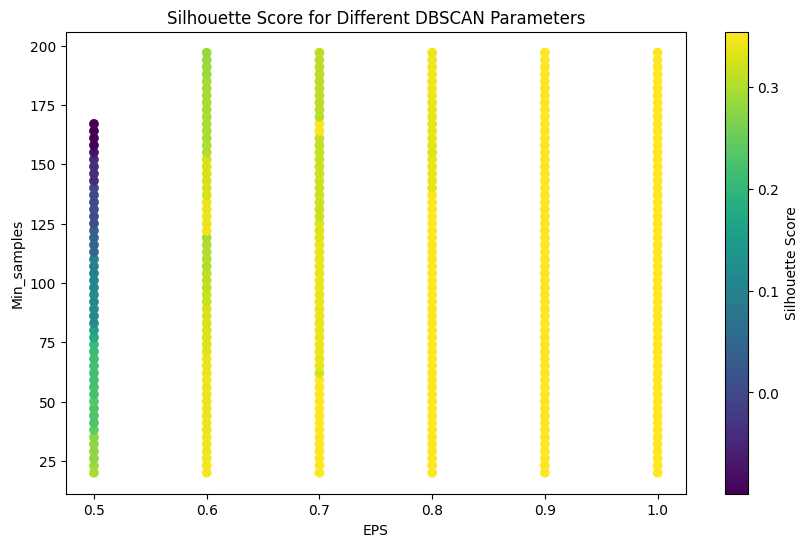

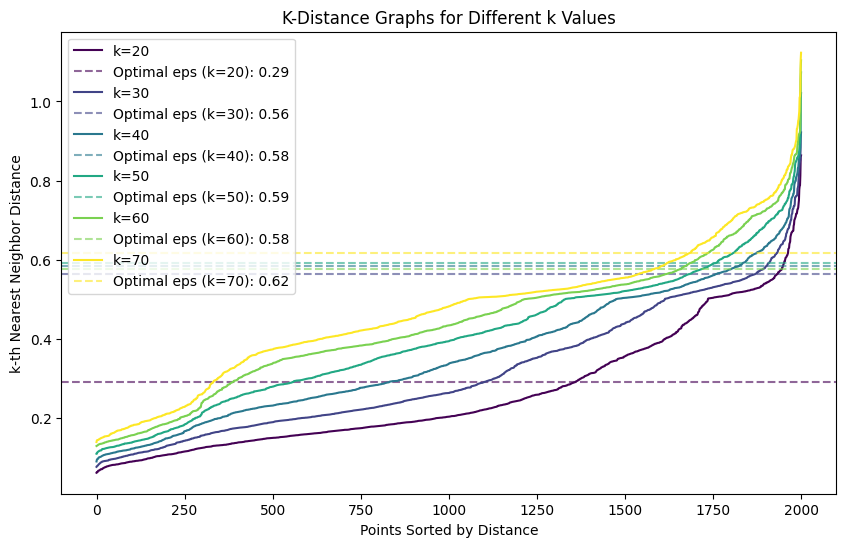

Optimal eps values for each k: {20: np.float64(0.2896304938275913), 30: np.float64(0.562381409817378), 40: np.float64(0.5840446793690848), 50: np.float64(0.5925966852219281), 60: np.float64(0.5756417179943898), 70: np.float64(0.6175730364365632)}


In [ ]:
#DBSCAN ON Customer Data on Scaled Data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
# Range of EPS and Min_samples values to test
eps_values = np.arange(0.5, 2.0, 0.1)  # Try smaller EPS values (0.1 to 2.0)
min_samples_values = np.arange(20, 200, 3)

best_score = -1
best_params = None
best_labels = None
best_model = None
num_clusters_dict = {}

# Loop over different combinations of EPS and Min_samples
silhouette_scores = []
param_combinations = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(X_scaled)

        # Count number of clusters (excluding noise)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Only evaluate silhouette score if there are at least 2 clusters
        if num_clusters > 1:
            score = silhouette_score(X_scaled, labels)
            silhouette_scores.append(score)
            param_combinations.append((eps, min_samples))
            num_clusters_dict[(eps, min_samples)] = num_clusters

            if score > best_score:
                best_score = score
                best_params = (eps, min_samples,num_clusters)
                best_labels = labels
                best_model = dbscan

# Extracting the best parameters
eps_best, min_samples_best,num_clusters = best_params
print(f"Best EPS: {eps_best}, Best Min_samples: {min_samples_best}, Best Silhouette Score: {best_score} , Number of Clusters: {num_clusters}")

# Plot silhouette scores
fig = plt.figure(figsize=(10, 6))
plt.scatter([p[0] for p in param_combinations], [p[1] for p in param_combinations], c=silhouette_scores, cmap='viridis', marker='o')
plt.colorbar(label='Silhouette Score')
plt.xlabel('EPS')
plt.ylabel('Min_samples')
plt.title('Silhouette Score for Different DBSCAN Parameters')
plt.show()



def find_elbow_point(distances):
    """Alternative method to find the elbow point using the maximum curvature."""
    n_points = len(distances)
    all_coords = np.vstack((range(n_points), distances)).T

    # Define a line from the first to the last point
    first_point = all_coords[0]
    last_point = all_coords[-1]
    line_vec = last_point - first_point
    line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))

    # Compute distances to the line (perpendicular distance)
    vec_from_first = all_coords - first_point
    scalar_product = np.sum(vec_from_first * line_vec_norm, axis=1)
    vec_proj = np.outer(scalar_product, line_vec_norm)
    perpendicular_vec = vec_from_first - vec_proj
    distances_to_line = np.sqrt(np.sum(perpendicular_vec**2, axis=1))

    elbow_index = np.argmax(distances_to_line)
    return elbow_index, distances[elbow_index]

def plot_k_distance_graphs(data, k_values):
    plt.figure(figsize=(10, 6))
    optimal_eps_values = {}

    # Define color map for different k values
    colors = plt.cm.viridis(np.linspace(0, 1, len(k_values)))

    for i, (k, color) in enumerate(zip(k_values, colors)):
        # Compute the k-distance
        neigh = NearestNeighbors(n_neighbors=k)
        neigh.fit(data)
        distances, _ = neigh.kneighbors(data)

        # Sort the k-th nearest neighbor distance in ascending order
        k_distances = np.sort(distances[:, k - 1])

        # Find the elbow point using the max curvature method
        elbow_index, optimal_eps = find_elbow_point(k_distances)
        optimal_eps_values[k] = optimal_eps

        # Plot all graphs in one figure
        plt.plot(range(len(k_distances)), k_distances, label=f'k={k}', color=color)
        if optimal_eps is not None:
            plt.axhline(y=optimal_eps, color=color, linestyle='--', alpha=0.6, label=f'Optimal eps (k={k}): {optimal_eps:.2f}')

    plt.xlabel("Points Sorted by Distance")
    plt.ylabel("k-th Nearest Neighbor Distance")
    plt.title("K-Distance Graphs for Different k Values")
    plt.legend()
    plt.show()

    return optimal_eps_values



# List of k values to test
k_values = [20,30,40,50,60,70]

# Generate K-Distance Graphs and get optimal eps values
optimal_eps_values = plot_k_distance_graphs(X_scaled, k_values)
print("Optimal eps values for each k:", optimal_eps_values)

Best EPS: 99.8, Best Min_samples: 5, Best Silhouette Score: 0.03978402032035344 , Number of Clusters: 112
{(np.float64(20.300000000000004), np.int64(5)): 2, (np.float64(20.400000000000002), np.int64(5)): 2, (np.float64(20.500000000000004), np.int64(5)): 2, (np.float64(20.6), np.int64(5)): 2, (np.float64(20.700000000000003), np.int64(5)): 2, (np.float64(20.800000000000004), np.int64(5)): 2, (np.float64(20.900000000000002), np.int64(5)): 2, (np.float64(21.000000000000004), np.int64(5)): 2, (np.float64(21.1), np.int64(5)): 3, (np.float64(21.200000000000003), np.int64(5)): 3, (np.float64(21.300000000000004), np.int64(5)): 3, (np.float64(21.400000000000002), np.int64(5)): 3, (np.float64(21.500000000000004), np.int64(5)): 3, (np.float64(21.6), np.int64(5)): 3, (np.float64(21.700000000000003), np.int64(5)): 3, (np.float64(21.800000000000004), np.int64(5)): 3, (np.float64(21.900000000000002), np.int64(5)): 3, (np.float64(22.000000000000004), np.int64(5)): 3, (np.float64(22.1), np.int64(5)): 3,

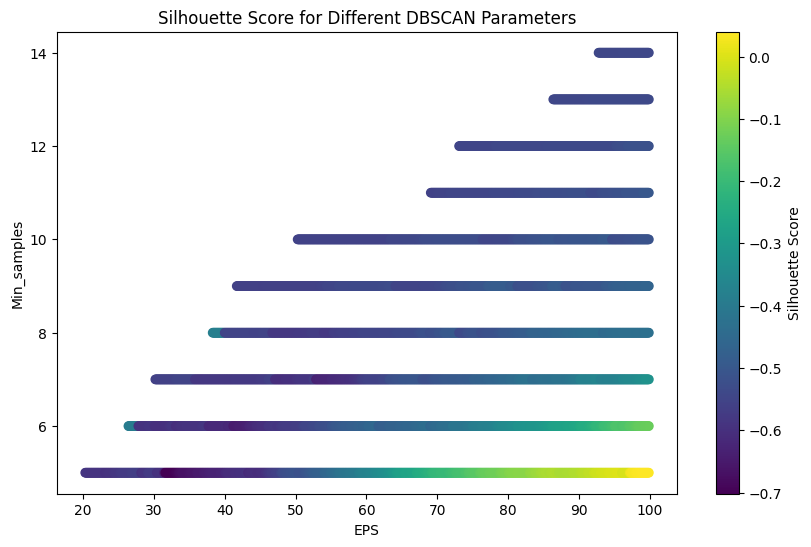

In [ ]:
#DBSCAN ON Customer Data on Non Scaled Data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform
# Range of EPS and Min_samples values to test
eps_values = np.arange(0.1, 100.0, 0.1)  # Try smaller EPS values (0.1 to 2.0)
min_samples_values = np.arange(5, 300, 1)



best_score = -1
best_params = None
best_labels = None
best_model = None
num_clusters_dict = {}

# Loop over different combinations of EPS and Min_samples
silhouette_scores = []
param_combinations = []

for eps in eps_values:
    for min_samples in min_samples_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(df)

        # Count number of clusters (excluding noise)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Only evaluate silhouette score if there are at least 2 clusters
        if num_clusters > 1:
            score = silhouette_score(df, labels)
            silhouette_scores.append(score)
            param_combinations.append((eps, min_samples))
            num_clusters_dict[(eps, min_samples)] = num_clusters

            if score > best_score:
                best_score = score
                best_params = (eps, min_samples,num_clusters)
                best_labels = labels
                best_model = dbscan

# Extracting the best parameters
if best_params is not None:
    eps_best, min_samples_best, num_clusters = best_params
    print(f"Best EPS: {eps_best}, Best Min_samples: {min_samples_best}, Best Silhouette Score: {best_score} , Number of Clusters: {num_clusters}")
else:
    print("No valid clustering found. Try adjusting `eps` or scaling the data.")

print(num_clusters_dict)

eps_best, min_samples_best,num_clusters = best_params
print(f"Best EPS: {eps_best}, Best Min_samples: {min_samples_best}, Best Silhouette Score: {best_score} , Number of Clusters: {num_clusters}")

# Plot silhouette scores
fig = plt.figure(figsize=(10, 6))
plt.scatter([p[0] for p in param_combinations], [p[1] for p in param_combinations], c=silhouette_scores, cmap='viridis', marker='o')
plt.colorbar(label='Silhouette Score')
plt.xlabel('EPS')
plt.ylabel('Min_samples')
plt.title('Silhouette Score for Different DBSCAN Parameters')
plt.show()





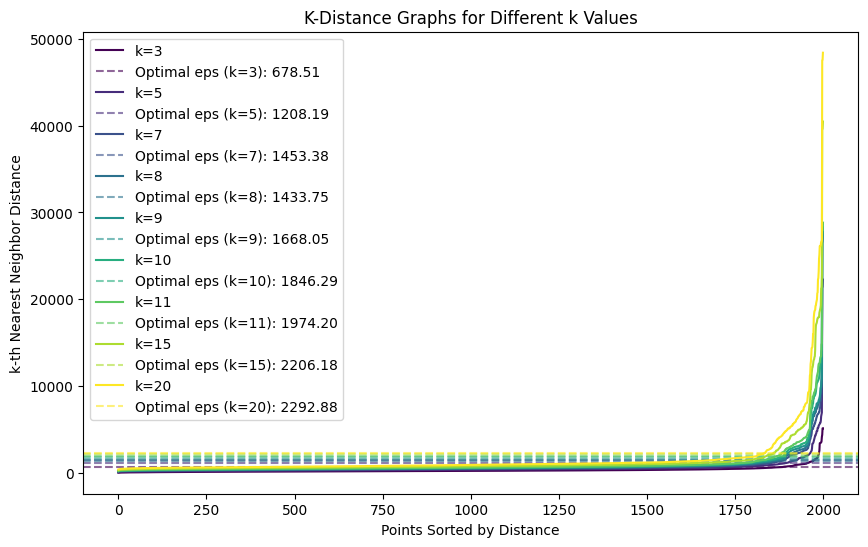

Optimal eps values for each k: {3: np.float64(678.5057111034512), 5: np.float64(1208.1899685066087), 7: np.float64(1453.3784778921147), 8: np.float64(1433.7492807321648), 9: np.float64(1668.0524572087054), 10: np.float64(1846.294126080674), 11: np.float64(1974.1970519682172), 15: np.float64(2206.181996119087), 20: np.float64(2292.8765775767347)}


In [ ]:
def find_elbow_point(distances):
    """Alternative method to find the elbow point using the maximum curvature."""
    n_points = len(distances)
    all_coords = np.vstack((range(n_points), distances)).T

    # Define a line from the first to the last point
    first_point = all_coords[0]
    last_point = all_coords[-1]
    line_vec = last_point - first_point
    line_vec_norm = line_vec / np.sqrt(np.sum(line_vec**2))

    # Compute distances to the line (perpendicular distance)
    vec_from_first = all_coords - first_point
    scalar_product = np.sum(vec_from_first * line_vec_norm, axis=1)
    vec_proj = np.outer(scalar_product, line_vec_norm)
    perpendicular_vec = vec_from_first - vec_proj
    distances_to_line = np.sqrt(np.sum(perpendicular_vec**2, axis=1))

    elbow_index = np.argmax(distances_to_line)
    return elbow_index, distances[elbow_index]

def plot_k_distance_graphs(data, k_values):
    plt.figure(figsize=(10, 6))
    optimal_eps_values = {}

    # Define color map for different k values
    colors = plt.cm.viridis(np.linspace(0, 1, len(k_values)))

    for i, (k, color) in enumerate(zip(k_values, colors)):
        # Compute the k-distance
        neigh = NearestNeighbors(n_neighbors=k)
        neigh.fit(data)
        distances, _ = neigh.kneighbors(data)

        # Sort the k-th nearest neighbor distance in ascending order
        k_distances = np.sort(distances[:, k - 1])

        # Find the elbow point using the max curvature method
        elbow_index, optimal_eps = find_elbow_point(k_distances)
        optimal_eps_values[k] = optimal_eps

        # Plot all graphs in one figure
        plt.plot(range(len(k_distances)), k_distances, label=f'k={k}', color=color)
        if optimal_eps is not None:
            plt.axhline(y=optimal_eps, color=color, linestyle='--', alpha=0.6, label=f'Optimal eps (k={k}): {optimal_eps:.2f}')

    plt.xlabel("Points Sorted by Distance")
    plt.ylabel("k-th Nearest Neighbor Distance")
    plt.title("K-Distance Graphs for Different k Values")
    plt.legend()
    plt.show()

    return optimal_eps_values



# List of k values to test
k_values = [3, 5, 7,8,9, 10,11, 15, 20]

# Generate K-Distance Graphs and get optimal eps values
optimal_eps_values = plot_k_distance_graphs(df, k_values)
print("Optimal eps values for each k:", optimal_eps_values)

# **Conclusion**

--> Scaling negatively affects K-Means and Hierarchical Clustering but significantly improves DBScan.

--> Hierarchical Clustering is the best choice for non-scaled data due to its highest silhouette score (0.6858).

--> DBScan performs well only when scaling is applied, making it ideal for datasets with arbitrary cluster shapes.

--> K-Means is inconsistent, producing too many clusters when scaled and performing better when non-scaled.

--> Distance-based algorithms like Hierarchical Clustering and DBScan are highly sensitive to scaling.


**Why DBscan failed on non scaled Customer Dataset?**
1. Sensitivity to Feature Magnitudes
DBScan is a density-based clustering algorithm, meaning it relies on computing distances between points. If one feature has a significantly larger scale than others, it will dominate the distance computation. In the non-scaled dataset, features like Income (ranging from tens of thousands to hundreds of thousands) had much larger values compared to other features like Age (ranging from 18 to 76).

Result:

-->DBScan mostly considered the Income feature when calculating distance.

-->Other features contributed almost nothing to cluster formation.

-->This led to a distorted density estimation, preventing meaningful clustering.

2. High Noise Points and Outliers
DBScan labels points as noise (-1) if they don’t have enough nearby neighbors within EPS. In the non-scaled dataset, since Income had huge values, distances became too large for other points to be considered close enough.

Result:

Many points were labeled as outliers (DBScan couldn’t cluster them).

This made the clustering process fail, producing meaningless results.



Wrong

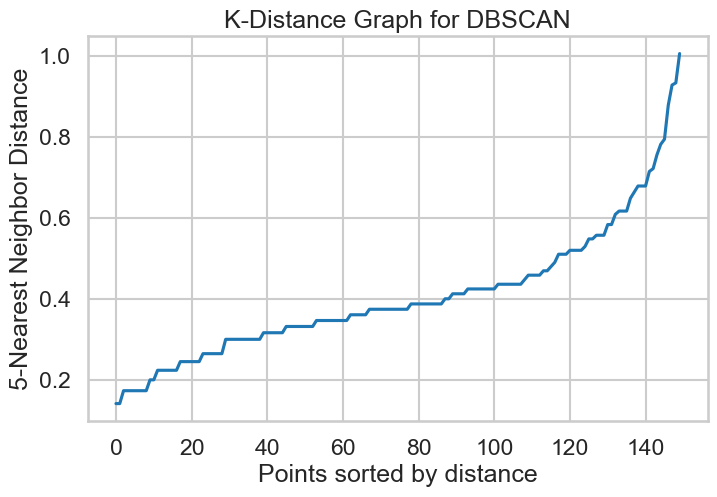

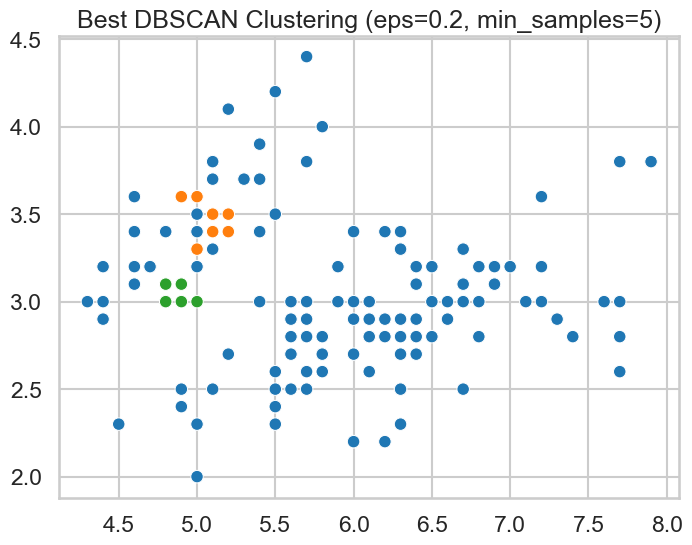

Best DBSCAN EPS: 0.2, Min Samples: 5 with Silhouette Score: 0.1826


In [ ]:
#WRONG
from sklearn.neighbors import NearestNeighbors

# Step 1: Use K-Distance Graph to find optimal EPS
neighbors = NearestNeighbors(n_neighbors=5)  # Set min_samples to 5 (or another value)
neighbors_fit = neighbors.fit(X)
distances, indices = neighbors_fit.kneighbors(X)

# Sort and plot distances
distances = np.sort(distances[:, -1])

plt.figure(figsize=(8, 5))
plt.plot(distances)
plt.xlabel("Points sorted by distance")
plt.ylabel("5-Nearest Neighbor Distance")
plt.title("K-Distance Graph for DBSCAN")
plt.show()

# Find the "elbow" in the graph and manually set the best eps
best_eps = 0.2  # Change this based on your graph

# Step 2: Tune min_samples with the best EPS
min_samples_values = range(5, 26)
best_silhouette = -1
best_min_samples = None

for min_samples in min_samples_values:
    dbscan = DBSCAN(eps=best_eps, min_samples=min_samples)
    labels = dbscan.fit_predict(X)

    if len(set(labels)) > 1:  # At least 2 clusters
        silhouette = silhouette_score(X, labels)

        if silhouette > best_silhouette:
            best_silhouette = silhouette
            best_min_samples = min_samples

# Apply DBSCAN with best min_samples
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples)
best_labels = dbscan.fit_predict(X)
display_cluster(X, best_labels, title=f"Best DBSCAN Clustering (eps={best_eps}, min_samples={best_min_samples})")
print(f"Best DBSCAN EPS: {best_eps}, Min Samples: {best_min_samples} with Silhouette Score: {best_silhouette:.4f}")


EXTRAS


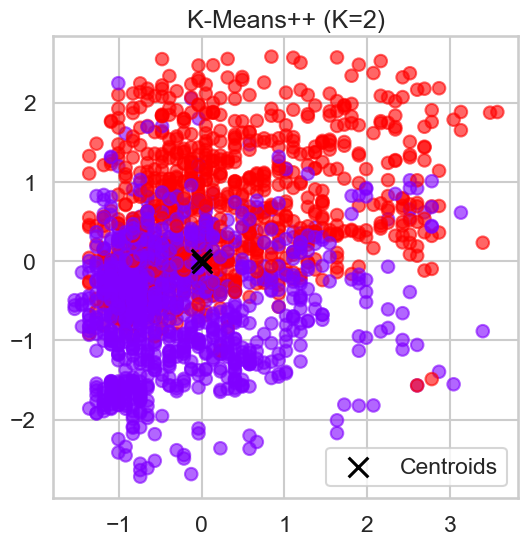

K=2, Silhouette Score: 0.2484


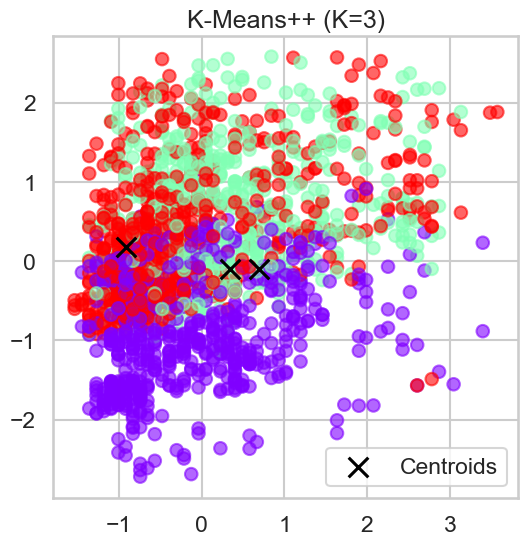

K=3, Silhouette Score: 0.2509


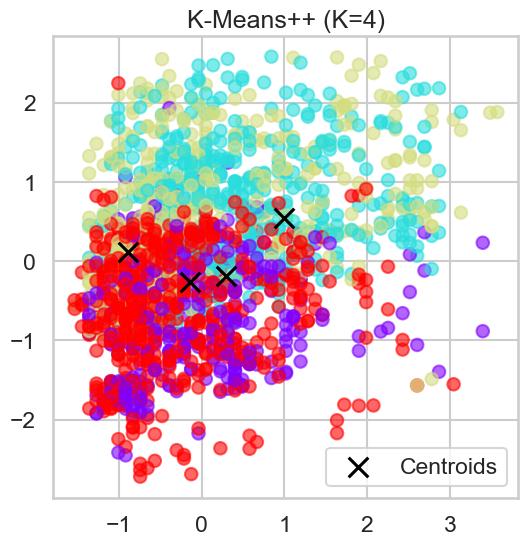

K=4, Silhouette Score: 0.2279


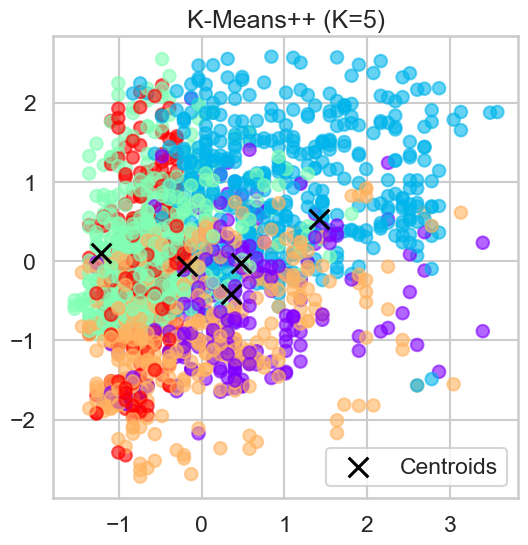

K=5, Silhouette Score: 0.2422


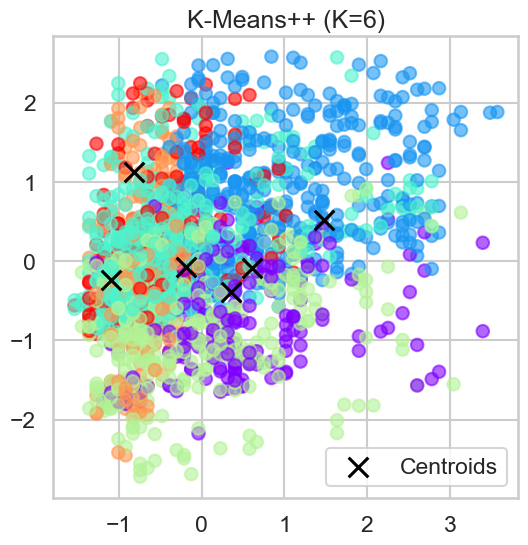

K=6, Silhouette Score: 0.2553


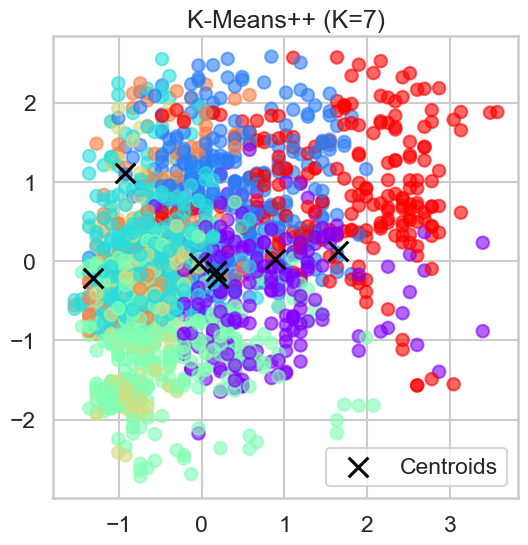

K=7, Silhouette Score: 0.2833


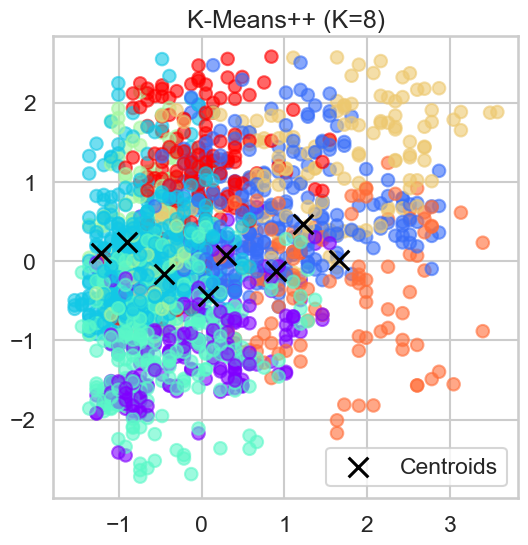

K=8, Silhouette Score: 0.2836


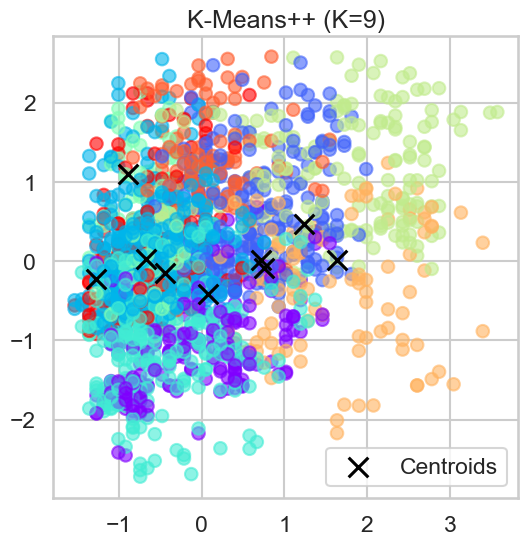

K=9, Silhouette Score: 0.3038


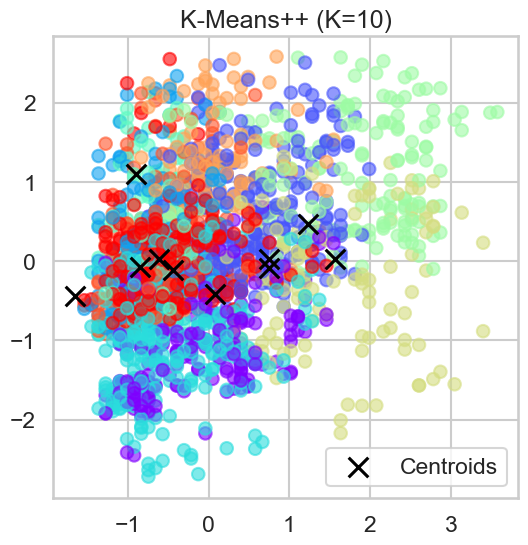

K=10, Silhouette Score: 0.3026


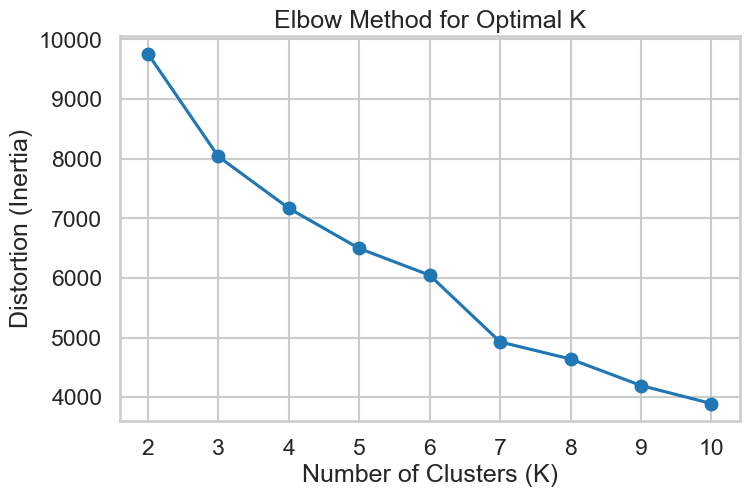

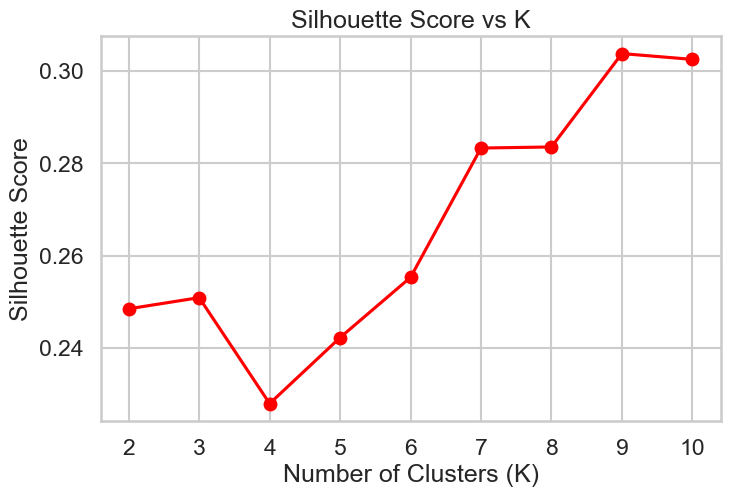

Best K chosen: 9 with Silhouette Score: 0.3038


In [ ]:
# K-Means Clustering with different K values on PCA values
distortions = []
silhouette_scores = []
k_values = range(2, 11)

for k in k_values:
    kmeans = KMeans(n_clusters=k, init='k-means++', random_state=42)
    kmeans_labels = kmeans.fit_predict(X_pca)

    distortions.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_pca, kmeans_labels))

    # Display clusters
    display_cluster2(X_scaled, kmeans_labels, kmeans.cluster_centers_, title=f"K-Means++ (K={k})")

    print(f"K={k}, Silhouette Score: {silhouette_scores[-1]:.4f}")

# Plot distortion function versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, distortions, marker='o')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Distortion (Inertia)")
plt.title("Elbow Method for Optimal K")
plt.show()

# Plot silhouette_score versus K
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', color='r')
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Silhouette Score")
plt.title("Silhouette Score vs K")
plt.show()

# Choose the best K based on silhouette score
best_k = k_values[np.argmax(silhouette_scores)]
best_silhouette_score = max(silhouette_scores)
print(f"Best K chosen: {best_k} with Silhouette Score: {best_silhouette_score:.4f}")


Affinity: euclidean, Linkage: ward, Silhouette Score: 0.4653


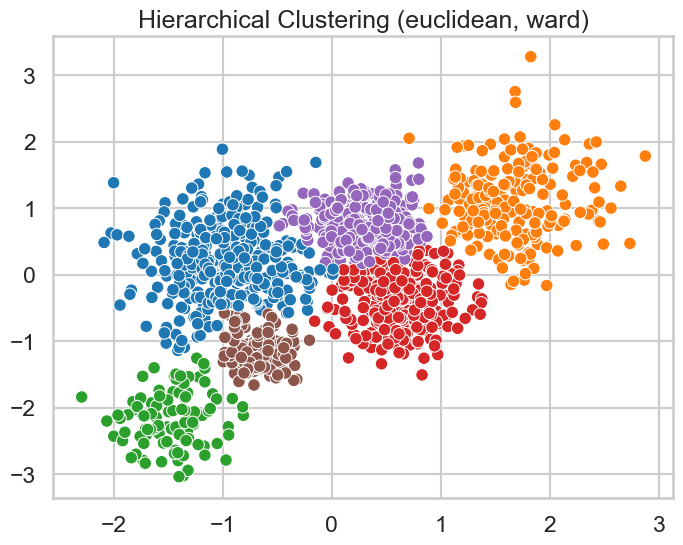

Affinity: euclidean, Linkage: complete, Silhouette Score: 0.3401


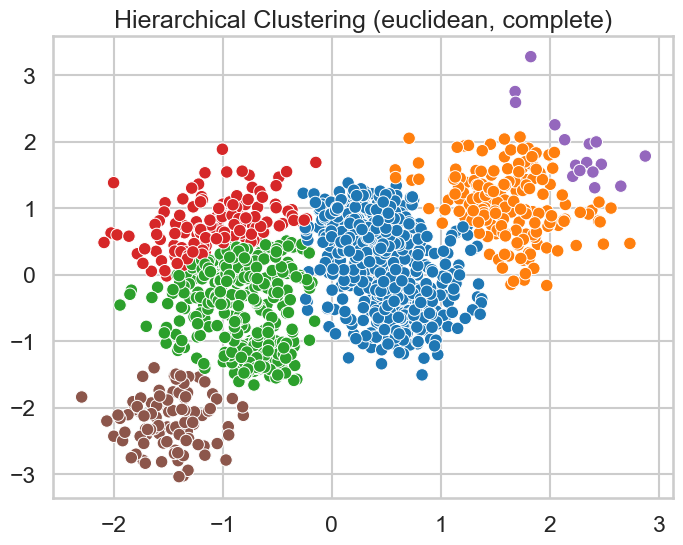

Affinity: euclidean, Linkage: average, Silhouette Score: 0.4101


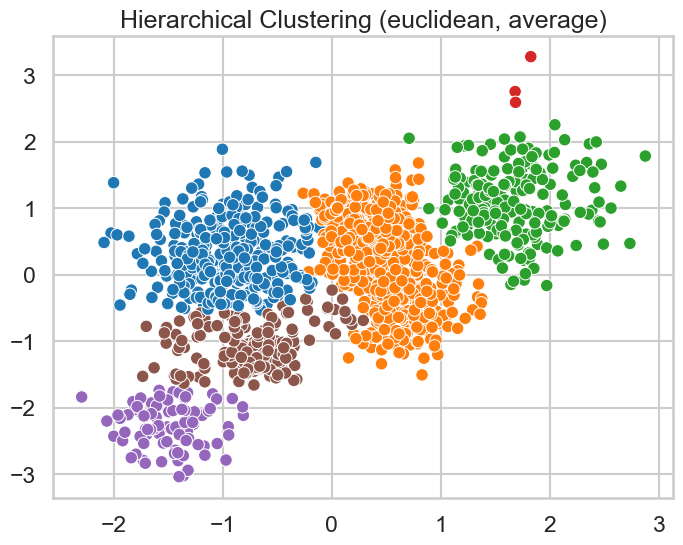

Affinity: euclidean, Linkage: single, Silhouette Score: 0.0846


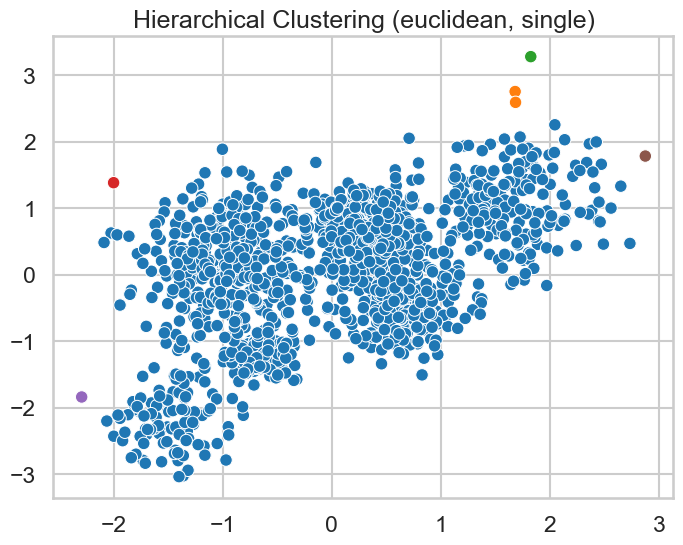

Affinity: manhattan, Linkage: complete, Silhouette Score: 0.3209


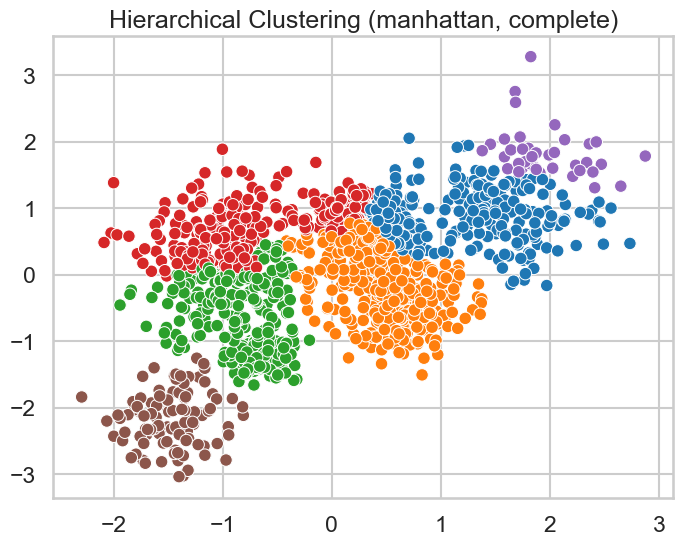

Affinity: manhattan, Linkage: average, Silhouette Score: 0.3930


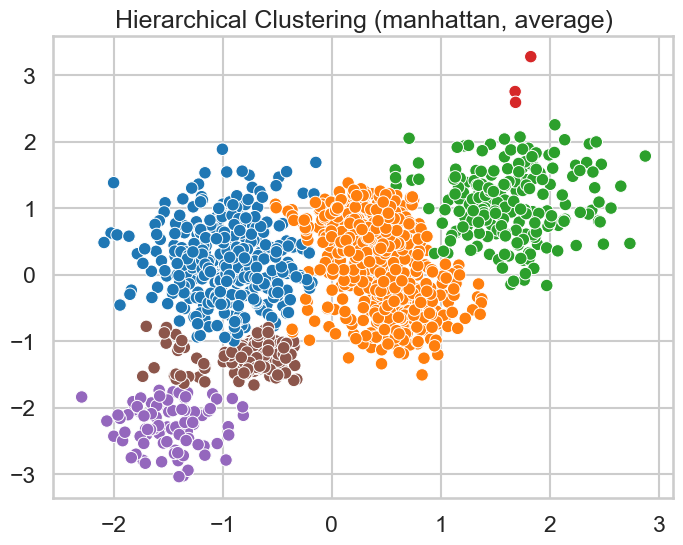

Affinity: manhattan, Linkage: single, Silhouette Score: 0.0846


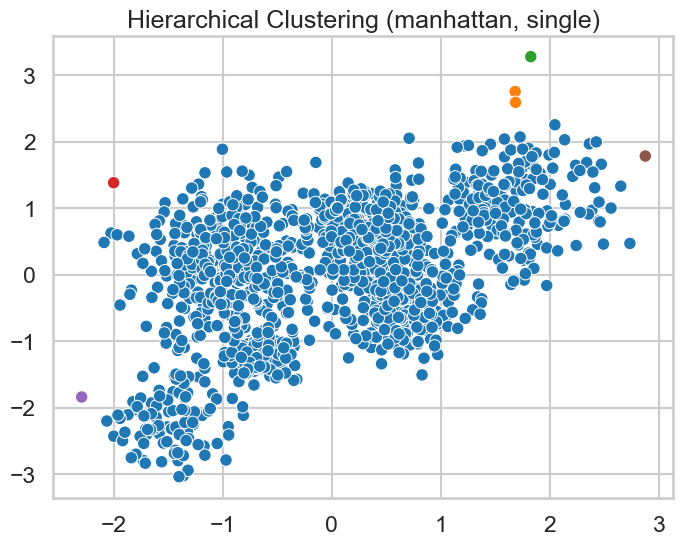

Affinity: cosine, Linkage: complete, Silhouette Score: 0.2632


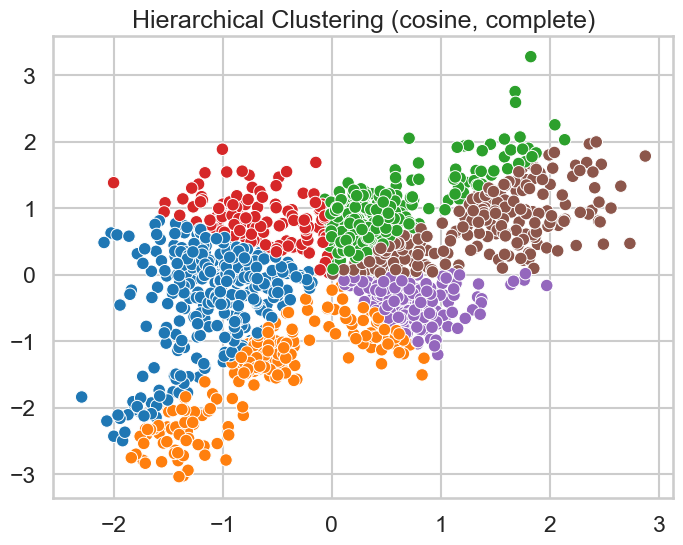

Affinity: cosine, Linkage: average, Silhouette Score: 0.2609


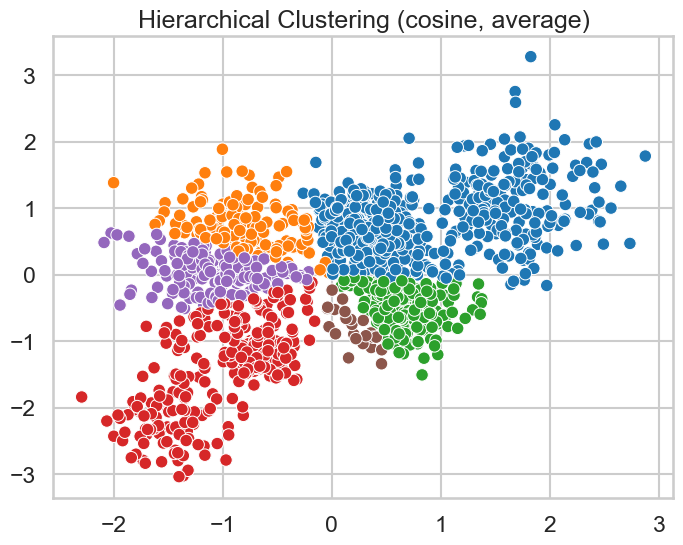

Affinity: cosine, Linkage: single, Silhouette Score: -0.1489


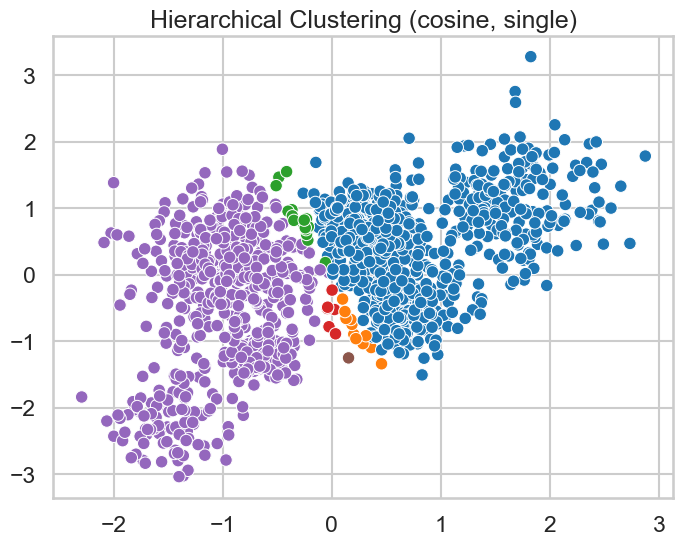

Best Hierarchical Clustering Parameters: Affinity=euclidean, Linkage=ward with Silhouette Score: 0.4653


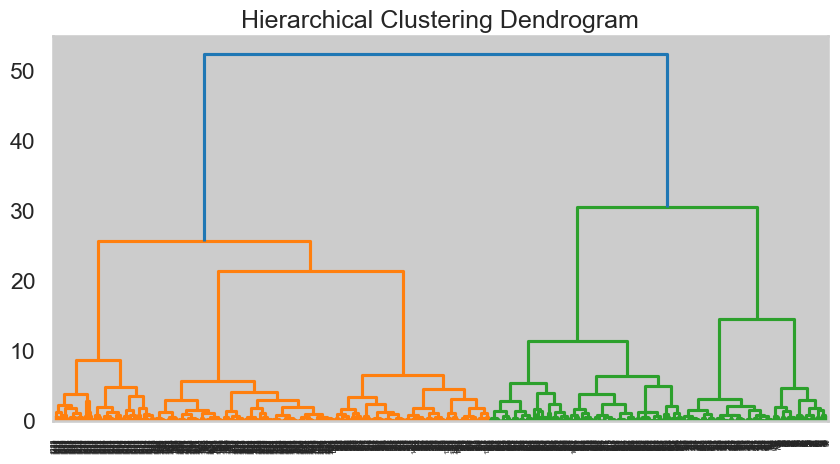

In [ ]:
# Agolomarative Clustering with 6 Clusters as the Kmeans output to visualize the difference

# Hierarchical Clustering with different parameters
affinities = ['euclidean', 'manhattan', 'cosine']
linkages = ['ward', 'complete', 'average', 'single']

best_hierarchical_silhouette = -1
best_params = None

for affinity in affinities:
    for linkage_method in linkages:
        if linkage_method == 'ward' and affinity != 'euclidean':
            continue  # Ward linkage requires Euclidean distance

        hierarchical = AgglomerativeClustering(n_clusters=6, metric=affinity, linkage=linkage_method)
        hierarchical_labels = hierarchical.fit_predict(X_scaled)
        silhouette = silhouette_score(X_scaled, hierarchical_labels)

        if silhouette > best_hierarchical_silhouette:
            best_hierarchical_silhouette = silhouette
            best_params = (affinity, linkage_method)

        print(f"Affinity: {affinity}, Linkage: {linkage_method}, Silhouette Score: {silhouette:.4f}")
        display_cluster(X_scaled, hierarchical_labels, title=f"Hierarchical Clustering ({affinity}, {linkage_method})")

print(f"Best Hierarchical Clustering Parameters: Affinity={best_params[0]}, Linkage={best_params[1]} with Silhouette Score: {best_hierarchical_silhouette:.4f}")

# Dendrogram
plt.figure(figsize=(10, 5))
linkage_matrix = linkage(X_scaled, method='ward')
dendrogram(linkage_matrix)
plt.title("Hierarchical Clustering Dendrogram")
plt.show()
